# Rainfall Weather Forecasting

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

Importing Dataset

In [2]:
rwf_df=pd.read_csv('weatherAUS.csv')

In [3]:
rwf_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
rwf_df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [5]:
rwf_df.shape

(8425, 23)

In the above datasets there are 8425 observations and 23 columns

In [6]:
rwf_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In the baove data sets null value are present in the datsets, all the columns are float type datasest except data, data is present in the object format later it will be converted in Data format

In [7]:
rwf_df.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

In the above data sets there is no identifier or constant columns. Looking at data it looks like we have a data fro 3004 dates

In [8]:
rwf_df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

there are several null values in the datasets

In [9]:
# Finding the percentage of null value in case there is null values in features
(rwf_df.isnull().sum()/(len(rwf_df)))*100

Date              0.000000
Location          0.000000
MinTemp           0.890208
MaxTemp           0.712166
Rainfall          2.848665
Evaporation      41.685460
Sunshine         47.406528
WindGustDir      11.762611
WindGustSpeed    11.762611
WindDir9am        9.839763
WindDir3pm        3.655786
WindSpeed9am      0.902077
WindSpeed3pm      1.270030
Humidity9am       0.700297
Humidity3pm       1.210682
Pressure9am      15.537092
Pressure3pm      15.572700
Cloud9am         28.735905
Cloud3pm         29.139466
Temp9am           0.664688
Temp3pm           1.139466
RainToday         2.848665
RainTomorrow      2.836795
dtype: float64

<AxesSubplot:>

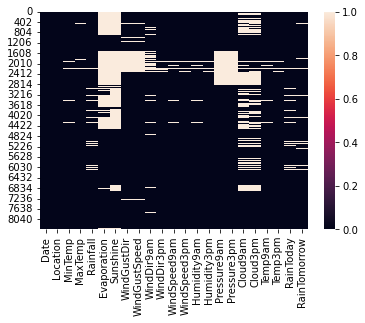

In [10]:
#Sns is the library sns-seaborn library
#lets visualize it using heatmap for null values
sns.heatmap(rwf_df.isnull())

# Feature Engineering

Feature engineering refers to the process of using domain knowledge to select and transform the most relevant variables from raw data when creating a predictive model using machine learning or statistical modeling. The main goal of Feature engineering is to create meaningful data from raw data.

from the above data sets data is object datatype now convert the date into int type becuse in featuring engineering date columns using in meachine learing model

object columns will aloso be convert into interger type after data visulaization

In [11]:
rwf_df['Date']=pd.to_datetime(rwf_df['Date'])
rwf_df['Month']=rwf_df['Date'].apply(lambda x:x.month)
rwf_df['Day']=rwf_df['Date'].apply(lambda x:x.day)

In [12]:
rwf_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           8425 non-null   datetime64[ns]
 1   Location       8425 non-null   object        
 2   MinTemp        8350 non-null   float64       
 3   MaxTemp        8365 non-null   float64       
 4   Rainfall       8185 non-null   float64       
 5   Evaporation    4913 non-null   float64       
 6   Sunshine       4431 non-null   float64       
 7   WindGustDir    7434 non-null   object        
 8   WindGustSpeed  7434 non-null   float64       
 9   WindDir9am     7596 non-null   object        
 10  WindDir3pm     8117 non-null   object        
 11  WindSpeed9am   8349 non-null   float64       
 12  WindSpeed3pm   8318 non-null   float64       
 13  Humidity9am    8366 non-null   float64       
 14  Humidity3pm    8323 non-null   float64       
 15  Pressure9am    7116 n

In [13]:
rwf_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,12,1
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,12,2
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,12,3
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,12,4
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,12,5


Data Cleaning/Wrangling

Some names of the variables are not relevant and not easy to understand. Some data may have data entry errors, and some variables may need data type conversion. We need to fix this issue in the data.

All the datas are relevent to and easy to understand, there is no data entry error in this dataframe and also there is no need to convert the variable data

here it is done the fundamental data analysis, Featuring, and data clean-up. Let’s move to the EDA process

# EDA Exploratory Data Analysis

Exploratory Data Analysis refers to the crucial process of performing initial investigations on data to discover patterns to check assumptions with the help of summary statistics and graphical representations.

EDA can be leveraged to check for outliers, patterns, and trends in the given data.

EDA helps to find meaningful patterns in data.

EDA provides in-depth insights into the data sets to solve our business problems.

EDA gives a clue to impute missing values in the dataset

# Statistics Summary

The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In [14]:
rwf_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Month,Day
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934,6.442136,15.741958
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020,3.437994,8.787354
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,1.000000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000,3.000000,8.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000,6.000000,16.000000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000,9.000000,23.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,12.000000,31.000000


The Count shows there is  null values present in the dataset beacuse all the columns are not same values

#Stad Deviation #min - miniumum value of all the values #25% -Quartile -1st quartile

#50% -Quartile- and its also say median -2nd quartile

#75% -Quaratile -3rd quartile

#Max - are largest value

#Mean is less than the median it means your data is left escape 

#mean is greater than median then it means your data is right escaped


Before we do EDA, lets separate Numerical and categorical variables for easy analysis- in case nay numerical and categorical values are there

In [15]:
#Separting Numerical and categorical column

categorical_col = []
for i in rwf_df.dtypes.index:
    if rwf_df.dtypes[i] == "object":     #dtypes[i]-dtypes of any columns object it will append that columns in empty list 
        categorical_col.append(i)    #append method is used to add the value in your existing list
print("Categorical Columns:", categorical_col)
print("\n")

#Checking for Numerical columns
#Explanatory mark is used for not- when the condition my datatype is not object in that time  
#cont--is not satisifed in that time it append the numerical list
numerical_col = []        #creating empty list
for i in rwf_df.dtypes.index:
    if rwf_df.dtypes[i]!='object':      
        numerical_col.append(i)
print("Numerical Columns:", numerical_col)

Categorical Columns: ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Numerical Columns: ['Date', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Month', 'Day']


# Data Visualization

# Univariate Analysis

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64

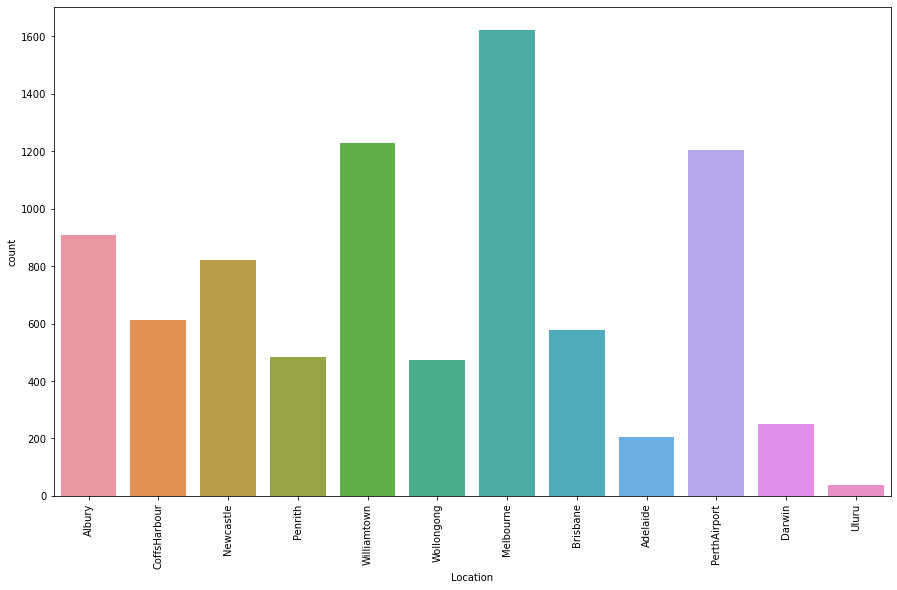

In [16]:
plt.figure(figsize=(15, 9))
sns.countplot(x='Location',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['Location'].value_counts()

In the above graph shows the melbourne shows the highest weather stations 1622 

N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64

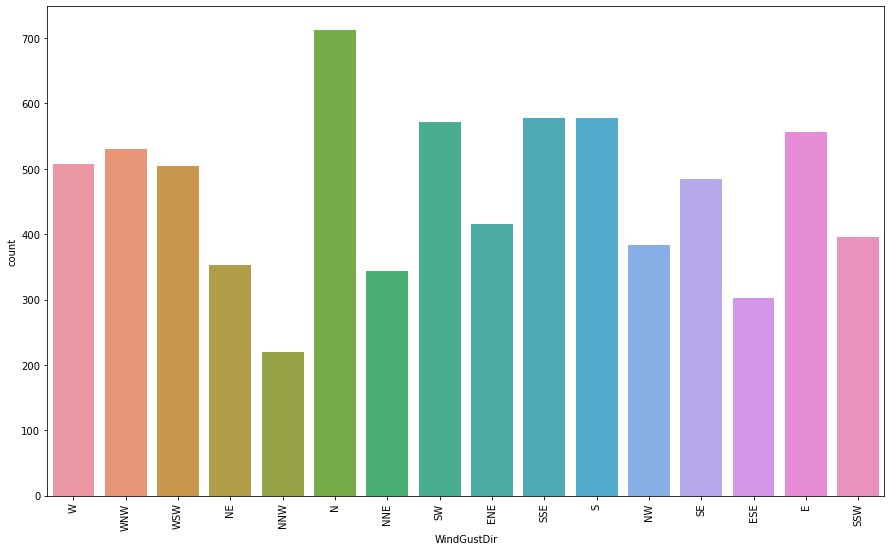

In [17]:
plt.figure(figsize=(15, 9))
sns.countplot(x='WindGustDir',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['WindGustDir'].value_counts()

we observe that graph shows The direction of the strongest wind gust in the 24 hours to midnight is North direction

N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: WindDir9am, dtype: int64

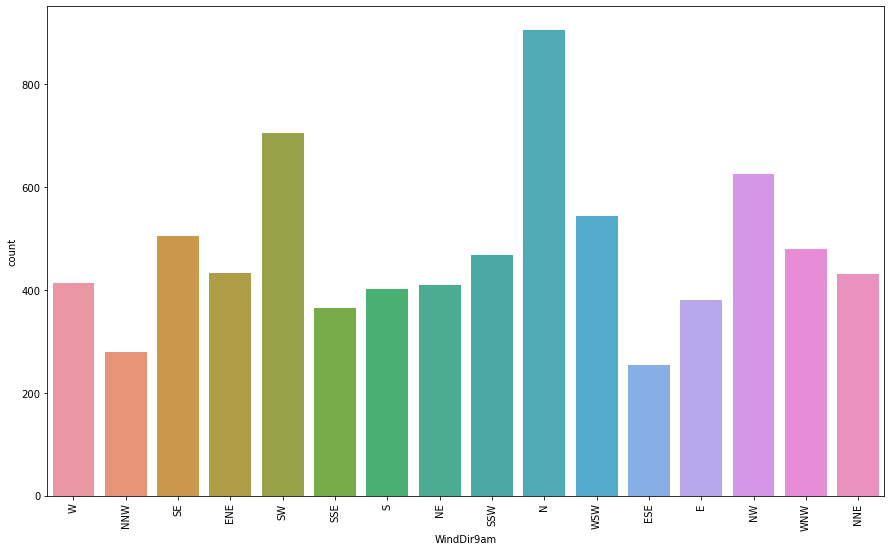

In [18]:
plt.figure(figsize=(15, 9))
sns.countplot(x='WindDir9am',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['WindDir9am'].value_counts()

we observe that graph shows The direction of the strongest wind at 9am is North direction

SE     813
S      742
SSE    623
WSW    580
NE     544
N      524
SW     494
WNW    487
NW     468
W      462
ESE    462
E      460
ENE    417
SSW    370
NNE    365
NNW    306
Name: WindDir3pm, dtype: int64

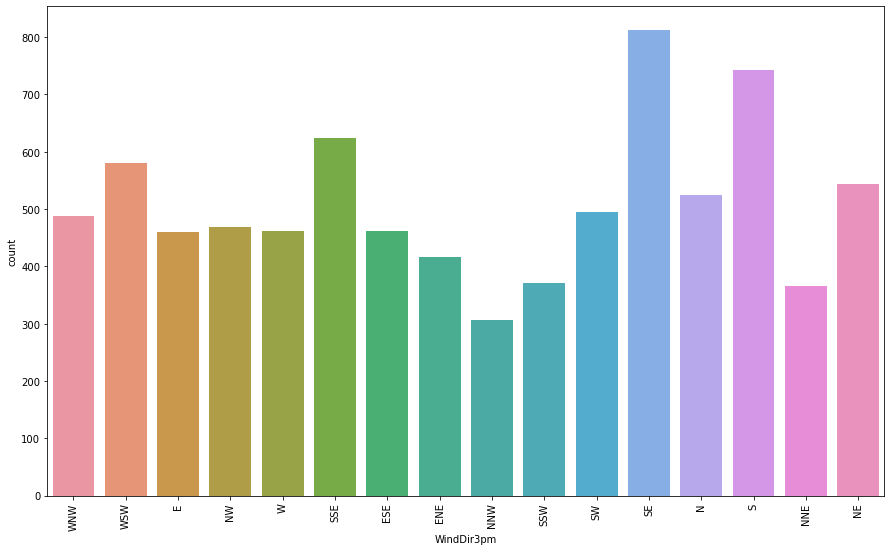

In [19]:
plt.figure(figsize=(15, 9))
sns.countplot(x='WindDir3pm',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['WindDir3pm'].value_counts()

we observe that graph shows The direction of the strongest wind at 3pm is SE direction

No     6195
Yes    1990
Name: RainToday, dtype: int64

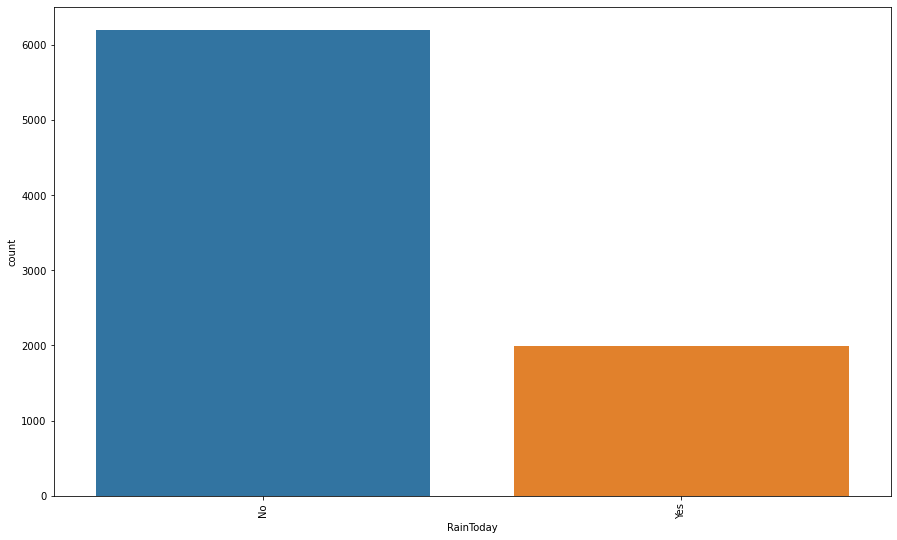

In [20]:
plt.figure(figsize=(15, 9))
sns.countplot(x='RainToday',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['RainToday'].value_counts()

We can observe that the count of "No rainToday" are high compared to the count of "Yes RainToday" i.e there are more number of rainfall Today This leads to class imbalance issues in the data. we will rectify it by using oversampling method in later part

No     6195
Yes    1991
Name: RainTomorrow, dtype: int64

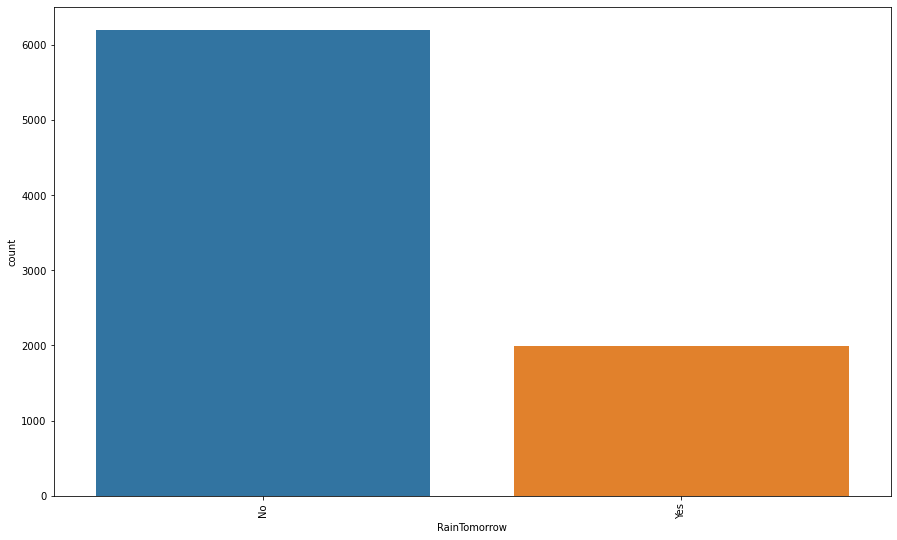

In [21]:
plt.figure(figsize=(15, 9))
sns.countplot(x='RainTomorrow',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['RainTomorrow'].value_counts()

We can observe that the count of "No rainTommorrow" are high compared to the count of "Yes RainToday" i.e there are more number of rainfall Today This leads to class imbalance issues in the data. we will rectify it by using oversampling method in later part


Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64

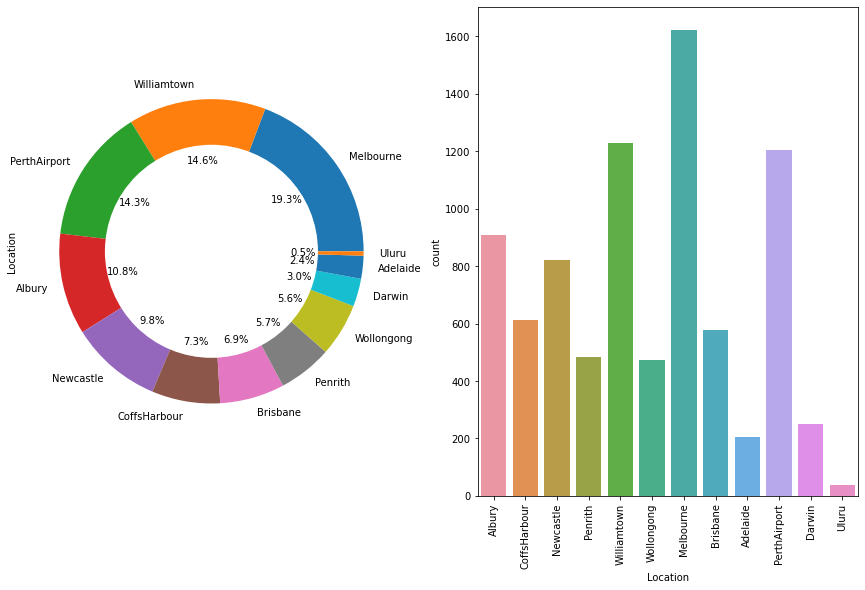

In [22]:
# Create a figure and subplot
plt.figure(figsize=(15, 9))
plt.subplot(1,2,1)
# Create a pie chart of value counts
rwf_df['Location'].value_counts().plot.pie(autopct='%1.1f%%')
centre=plt.Circle((0,0),0.7,fc='white')
fig=plt.gcf()
fig.gca().add_artist(centre)
plt.subplot(1,2,2)
sns.countplot(x='Location',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['Location'].value_counts()

N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64

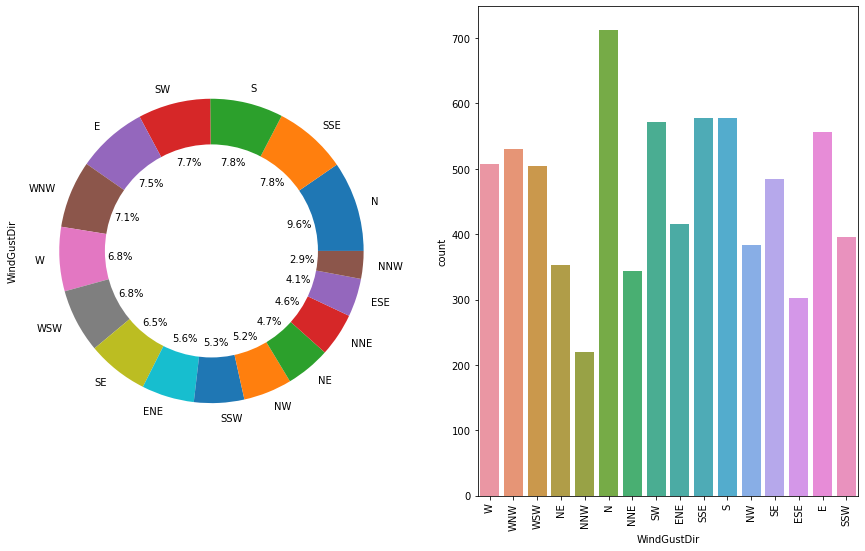

In [23]:
# Create a figure and subplot
plt.figure(figsize=(15, 9))
plt.subplot(1,2,1)
# Create a pie chart of value counts
rwf_df['WindGustDir'].value_counts().plot.pie(autopct='%1.1f%%')
centre=plt.Circle((0,0),0.7,fc='white')
fig=plt.gcf()
fig.gca().add_artist(centre)
plt.subplot(1,2,2)
sns.countplot(x='WindGustDir',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['WindGustDir'].value_counts()

N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: WindDir9am, dtype: int64

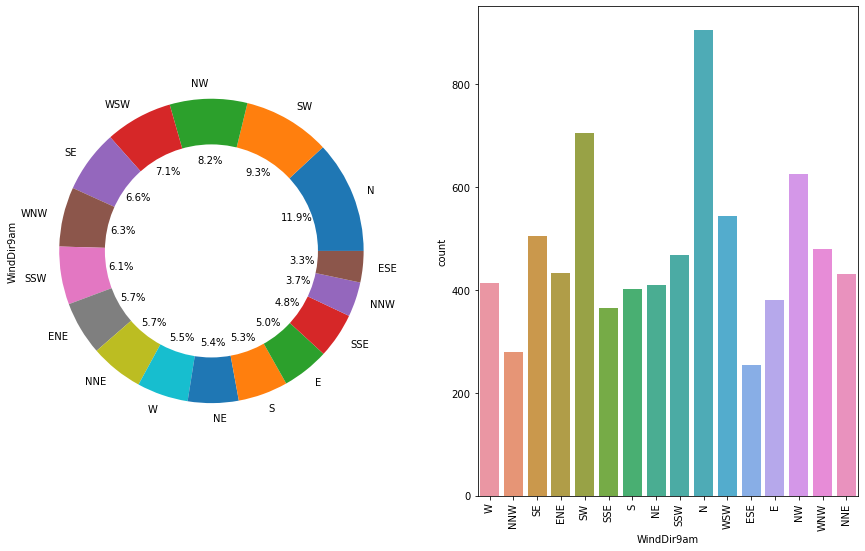

In [24]:
# Create a figure and subplot
plt.figure(figsize=(15, 9))
plt.subplot(1,2,1)
# Create a pie chart of value counts
rwf_df['WindDir9am'].value_counts().plot.pie(autopct='%1.1f%%')
centre=plt.Circle((0,0),0.7,fc='white')
fig=plt.gcf()
fig.gca().add_artist(centre)
plt.subplot(1,2,2)
sns.countplot(x='WindDir9am',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['WindDir9am'].value_counts()

SE     813
S      742
SSE    623
WSW    580
NE     544
N      524
SW     494
WNW    487
NW     468
W      462
ESE    462
E      460
ENE    417
SSW    370
NNE    365
NNW    306
Name: WindDir3pm, dtype: int64

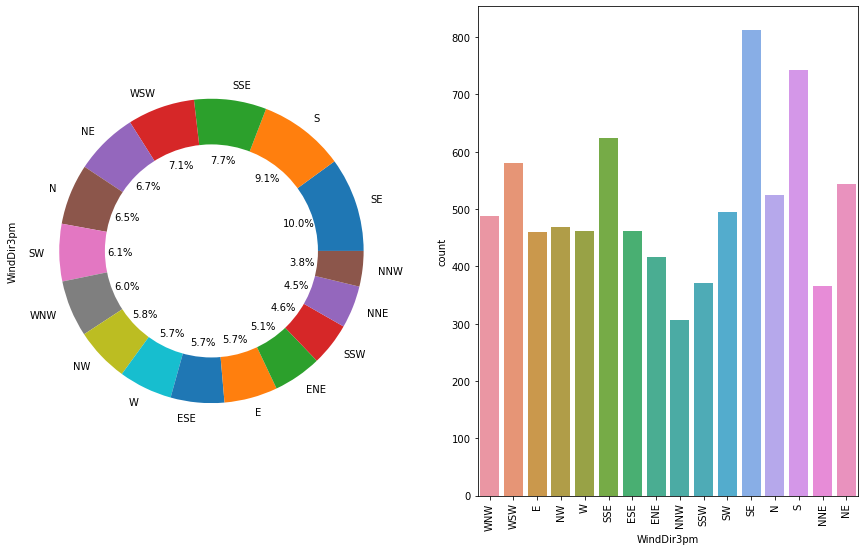

In [25]:
# Create a figure and subplot
plt.figure(figsize=(15, 9))
plt.subplot(1,2,1)
# Create a pie chart of value counts
rwf_df['WindDir3pm'].value_counts().plot.pie(autopct='%1.1f%%')
centre=plt.Circle((0,0),0.7,fc='white')
fig=plt.gcf()
fig.gca().add_artist(centre)
plt.subplot(1,2,2)
sns.countplot(x='WindDir3pm',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['WindDir3pm'].value_counts()

No     6195
Yes    1990
Name: RainToday, dtype: int64

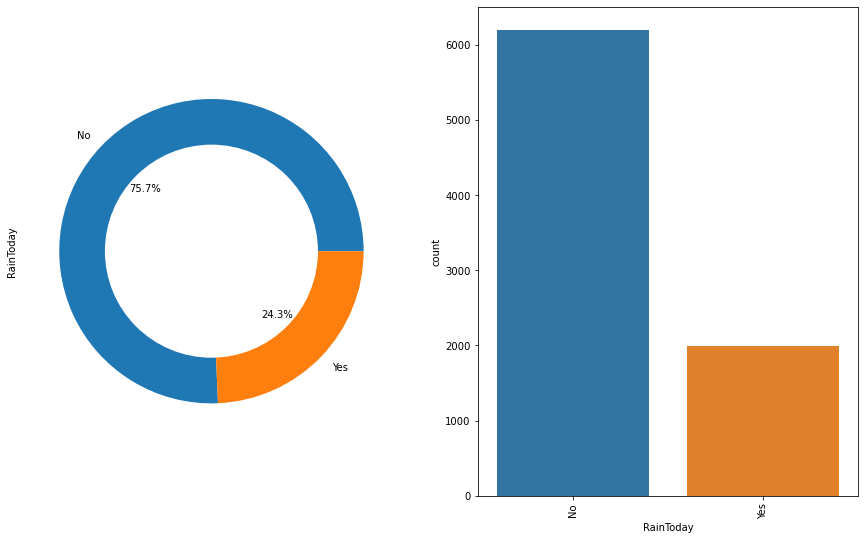

In [26]:
# Create a figure and subplot
plt.figure(figsize=(15, 9))
plt.subplot(1,2,1)
# Create a pie chart of value counts
rwf_df['RainToday'].value_counts().plot.pie(autopct='%1.1f%%')
centre=plt.Circle((0,0),0.7,fc='white')
fig=plt.gcf()
fig.gca().add_artist(centre)
plt.subplot(1,2,2)
sns.countplot(x='RainToday',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['RainToday'].value_counts()

No     6195
Yes    1991
Name: RainTomorrow, dtype: int64

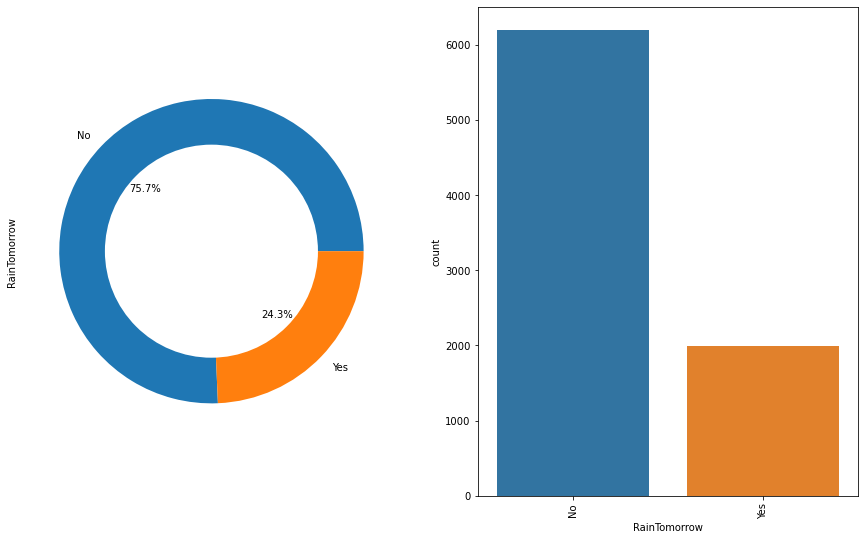

In [27]:
# Create a figure and subplot
plt.figure(figsize=(15, 9))
plt.subplot(1,2,1)
# Create a pie chart of value counts
rwf_df['RainTomorrow'].value_counts().plot.pie(autopct='%1.1f%%')
centre=plt.Circle((0,0),0.7,fc='white')
fig=plt.gcf()
fig.gca().add_artist(centre)
plt.subplot(1,2,2)
sns.countplot(x='RainTomorrow',data=rwf_df)
plt.xticks(rotation=90)
rwf_df['RainTomorrow'].value_counts()

Minimum MaxTemp is 8.2 and Maximum MaxTemp is 45.5
Minimum MinTemp is -2.0 and Maximum MinTemp is 28.5


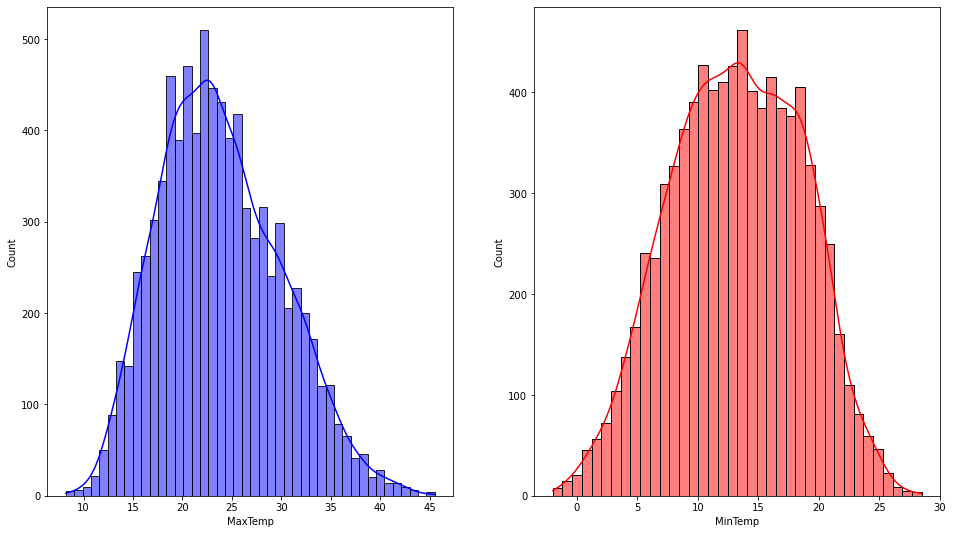

In [28]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.histplot(rwf_df['MaxTemp'],kde=True,color='b')
plt.subplot(1,2,2)
sns.histplot(rwf_df['MinTemp'],kde=True,color='r')
print('Minimum MaxTemp is {} and Maximum MaxTemp is {}'.format(rwf_df['MaxTemp'].min(),rwf_df['MaxTemp'].max()))
print('Minimum MinTemp is {} and Maximum MinTemp is {}'.format(rwf_df['MinTemp'].min(),rwf_df['MinTemp'].max()))

present Maxtemp & Mintemp are almost distributed equally, min Max temp is 8.2 and max maxtemp is 45.5 Min is mintemp of -2 and max of Mintemp of 28.5 

Minimum rainfall in mm is 0.0 and Maximum rainfall in mm is 371.0


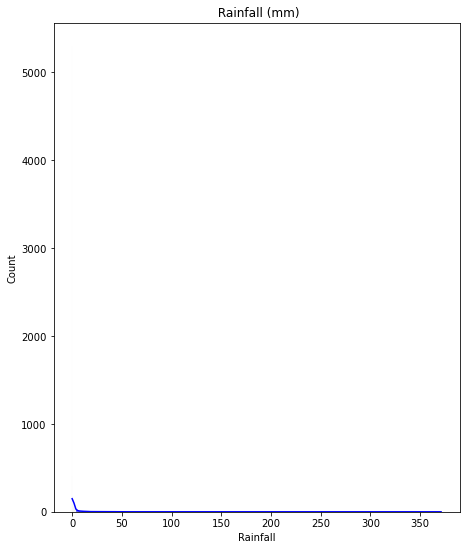

In [29]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.histplot(rwf_df['Rainfall'],kde=True,color='b')
plt.title(' Rainfall (mm)')
print('Minimum rainfall in mm is {} and Maximum rainfall in mm is {}'.format(rwf_df['Rainfall'].min(),rwf_df['Rainfall'].max()))

The minimum rainfall is zero and maximum rainfall is 371.00

Minimum Evaporation in mm is 0.0 and Maximum Evaporation in mm is 145.0


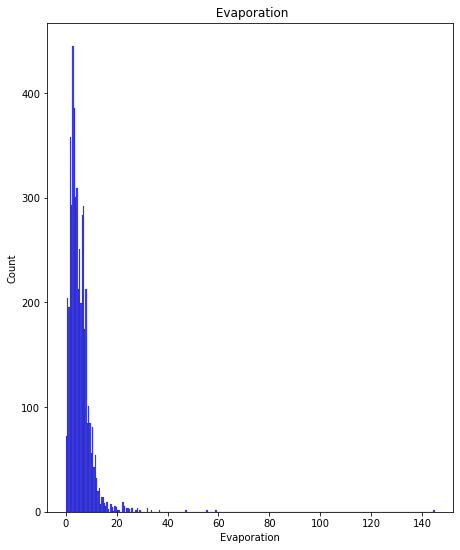

In [30]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.histplot(rwf_df['Evaporation'],kde=False,color='b')
plt.title(' Evaporation')
print('Minimum Evaporation in mm is {} and Maximum Evaporation in mm is {}'.format(rwf_df['Evaporation'].min(),rwf_df['Evaporation'].max()))

Minimum fan evaporation is 0 and maximum pan evaporation is 145.00

Minimum Sunshine in mm is 0.0 and Maximum Sunshine in mm is 13.9


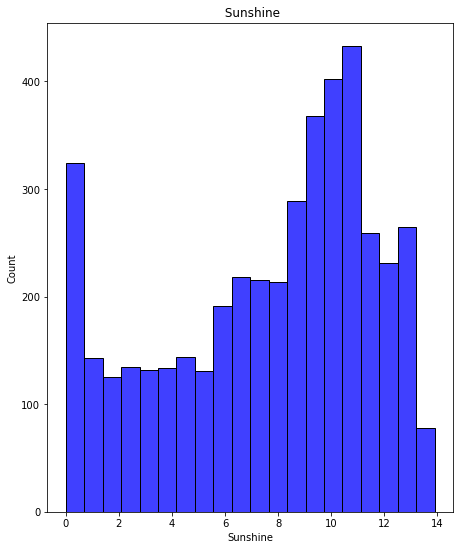

In [31]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.histplot(rwf_df['Sunshine'],kde=False,color='b')
plt.title(' Sunshine')
print('Minimum Sunshine in mm is {} and Maximum Sunshine in mm is {}'.format(rwf_df['Sunshine'].min(),rwf_df['Sunshine'].max()))

Minimum WindGustSpeed in mm is 7.0 and Maximum WindGustSpeed in mm is 107.0


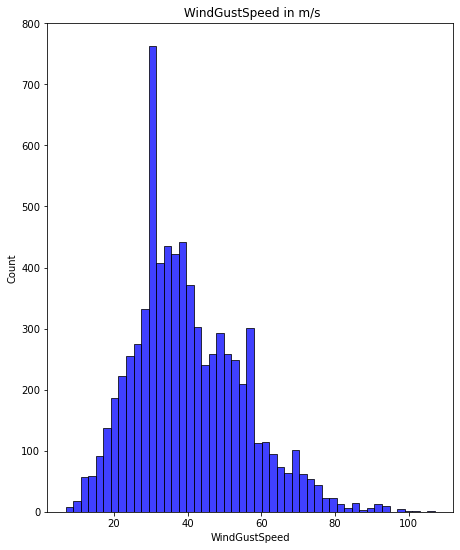

In [32]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.histplot(rwf_df['WindGustSpeed'],kde=False,color='b')
plt.title(' WindGustSpeed in m/s')
print('Minimum WindGustSpeed in mm is {} and Maximum WindGustSpeed in mm is {}'.format(rwf_df['WindGustSpeed'].min(),rwf_df['WindGustSpeed'].max()))

Minimum WindSpeed9am in mm is 0.0 and Maximum WindSpeed9am in mm is 63.0


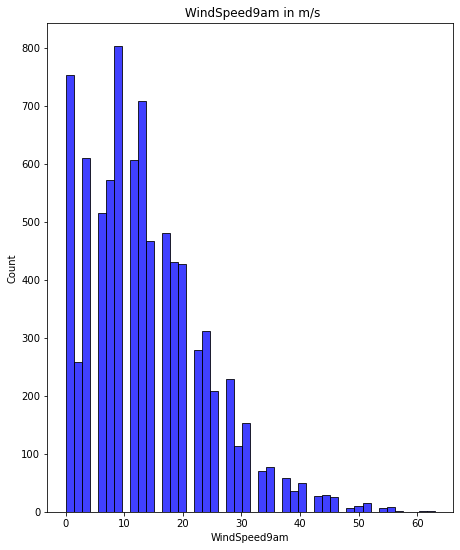

In [33]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.histplot(rwf_df['WindSpeed9am'],kde=False,color='b')
plt.title(' WindSpeed9am in m/s')
print('Minimum WindSpeed9am in mm is {} and Maximum WindSpeed9am in mm is {}'.format(rwf_df['WindSpeed9am'].min(),rwf_df['WindSpeed9am'].max()))

Minimum WindSpeed3pm in mm is 0.0 and Maximum WindSpeed3pm in mm is 83.0


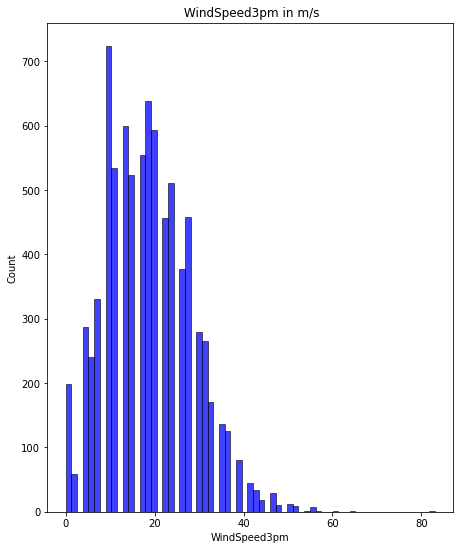

In [34]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.histplot(rwf_df['WindSpeed3pm'],kde=False,color='b')
plt.title(' WindSpeed3pm in m/s')
print('Minimum WindSpeed3pm in mm is {} and Maximum WindSpeed3pm in mm is {}'.format(rwf_df['WindSpeed3pm'].min(),rwf_df['WindSpeed3pm'].max()))

Minimum Humidity9am is 10.0 and Maximum Humidity9am is 100.0
Minimum Humidity3pm is 6.0 and Maximum Humidity3pm is 99.0


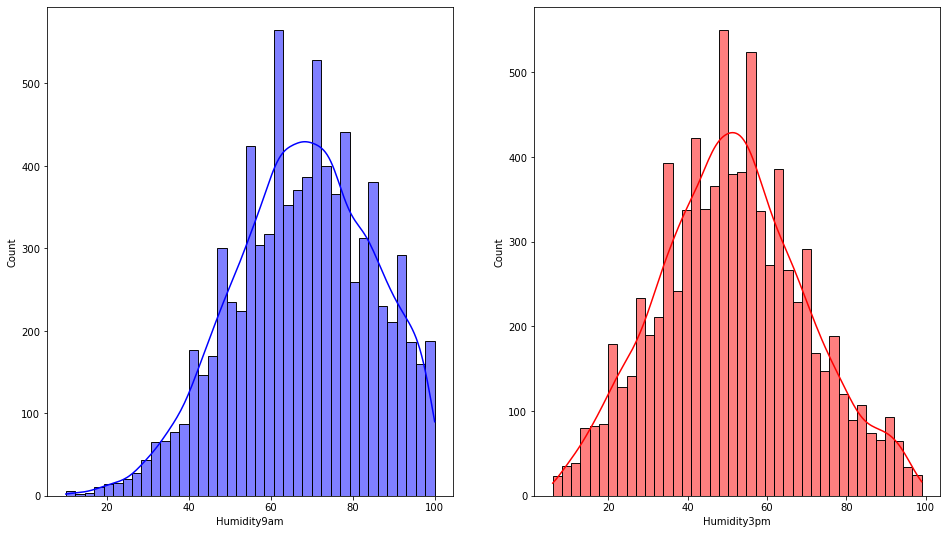

In [35]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.histplot(rwf_df['Humidity9am'],kde=True,color='b')
plt.subplot(1,2,2)
sns.histplot(rwf_df['Humidity3pm'],kde=True,color='r')
print('Minimum Humidity9am is {} and Maximum Humidity9am is {}'.format(rwf_df['Humidity9am'].min(),rwf_df['Humidity9am'].max()))
print('Minimum Humidity3pm is {} and Maximum Humidity3pm is {}'.format(rwf_df['Humidity3pm'].min(),rwf_df['Humidity3pm'].max()))

Minimum Pressure9am is 989.8 and Maximum Pressure9am is 1039.0
Minimum Pressure3pm is 982.9 and Maximum Pressure3pm is 1036.0


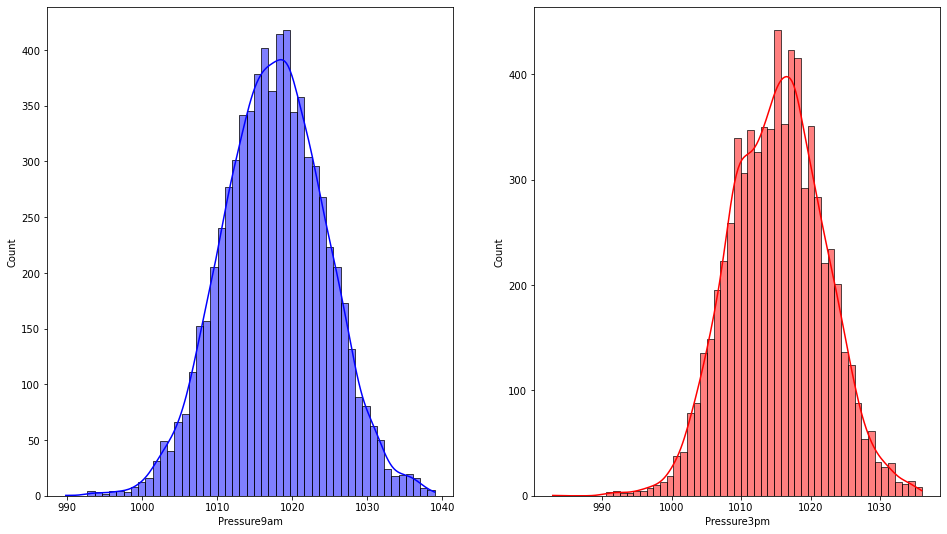

In [36]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.histplot(rwf_df['Pressure9am'],kde=True,color='b')
plt.subplot(1,2,2)
sns.histplot(rwf_df['Pressure3pm'],kde=True,color='r')
print('Minimum Pressure9am is {} and Maximum Pressure9am is {}'.format(rwf_df['Pressure9am'].min(),rwf_df['Pressure9am'].max()))
print('Minimum Pressure3pm is {} and Maximum Pressure3pm is {}'.format(rwf_df['Pressure3pm'].min(),rwf_df['Pressure3pm'].max()))

Minimum Cloud3pm is 0.0 and Maximum Cloud3pm is 8.0
Minimum Cloud3pm is 0.0 and Maximum Cloud3pm is 8.0


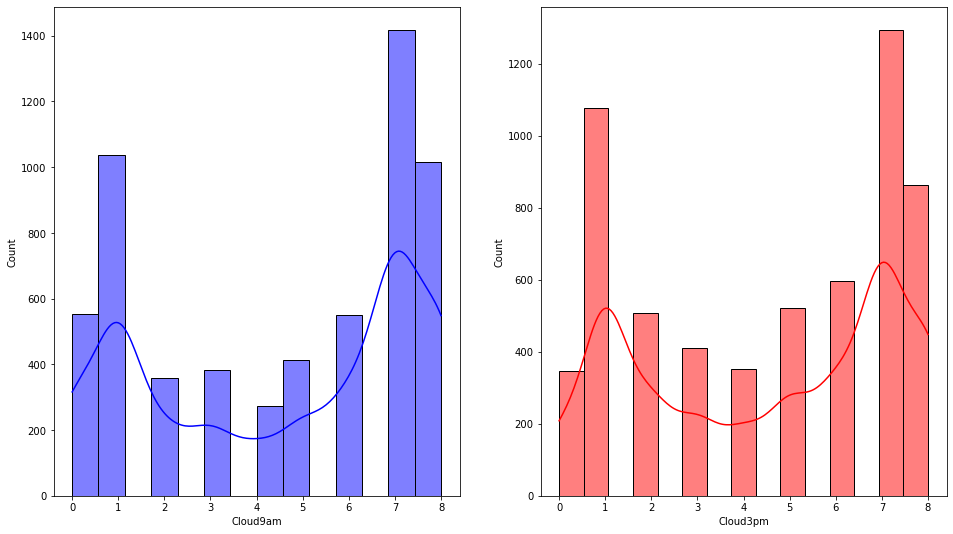

In [37]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.histplot(rwf_df['Cloud9am'],kde=True,color='b')
plt.subplot(1,2,2)
sns.histplot(rwf_df['Cloud3pm'],kde=True,color='r')
print('Minimum Cloud3pm is {} and Maximum Cloud3pm is {}'.format(rwf_df['Cloud3pm'].min(),rwf_df['Cloud3pm'].max()))
print('Minimum Cloud3pm is {} and Maximum Cloud3pm is {}'.format(rwf_df['Cloud3pm'].min(),rwf_df['Cloud3pm'].max()))

Minimum Temp9am is 1.9 and Maximum Temp9am is 39.4
Minimum Temp3pm is 7.3 and Maximum Temp3pm is 44.1


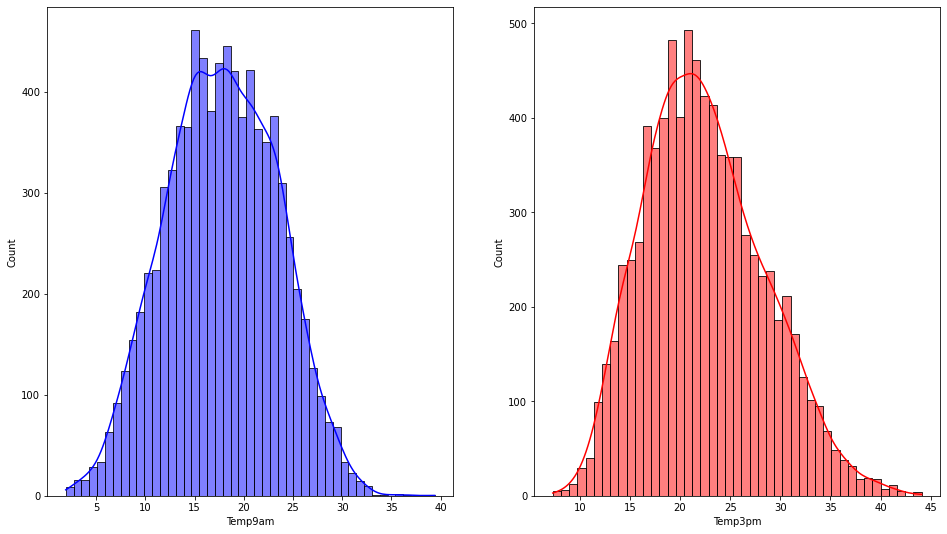

In [38]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.histplot(rwf_df['Temp9am'],kde=True,color='b')
plt.subplot(1,2,2)
sns.histplot(rwf_df['Temp3pm'],kde=True,color='r')
print('Minimum Temp9am is {} and Maximum Temp9am is {}'.format(rwf_df['Temp9am'].min(),rwf_df['Temp9am'].max()))
print('Minimum Temp3pm is {} and Maximum Temp3pm is {}'.format(rwf_df['Temp3pm'].min(),rwf_df['Temp3pm'].max()))

In [39]:
#Separating categorical and continuous variables
rwf=[i for i in rwf_df.columns if rwf_df[i].nunique()>30 and i!='Date']
cat=[i for i in rwf_df.columns if rwf_df[i].nunique()<30]

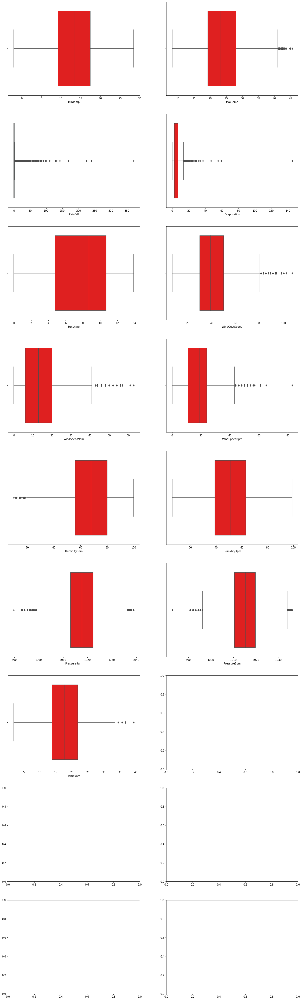

In [40]:
fig,ax=plt.subplots(9,2, figsize=(20,70))
r=0
c=0
for i, n in enumerate(rwf[:-2]):
    if i%2==0 and i>0:
        r+=1
        c=0
    sns.boxplot(rwf_df[n], color='r', ax=ax[r,c])
    c+=1

# EDA Bivariate Analysis

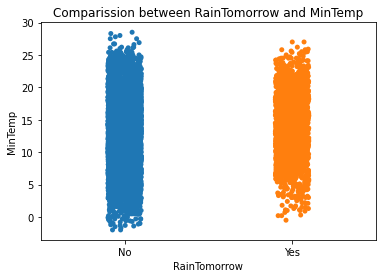

In [88]:
plt.title("Comparission between RainTomorrow and MinTemp")
sns.stripplot(x="RainTomorrow", y= "MinTemp", data = rwf_df)
plt.show()

we can observe that minimum temp varies the the possiblility of raintomarrow high

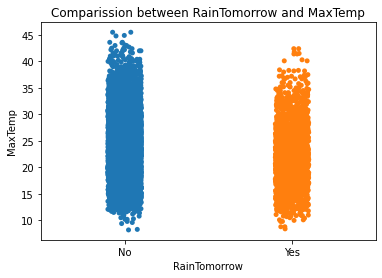

In [89]:
plt.title("Comparission between RainTomorrow and MaxTemp")
sns.stripplot(x="RainTomorrow", y= "MaxTemp", data = rwf_df)
plt.show()

We can observe that maximum temp recored today the possiblity of RainTomorrow is less

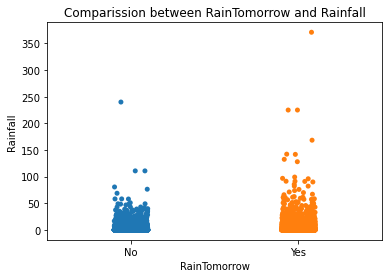

In [90]:
plt.title("Comparission between RainTomorrow and Rainfall")
sns.stripplot(x="RainTomorrow", y= "Rainfall", data = rwf_df)
plt.show()

we can observe that the possiblity of RainTomorrow is high 

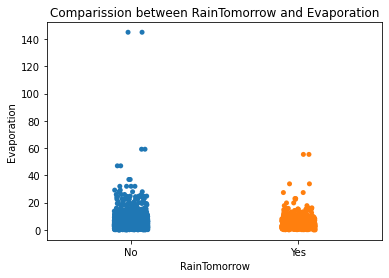

In [91]:
plt.title("Comparission between RainTomorrow and Evaporation")
sns.stripplot(x="RainTomorrow", y= "Evaporation", data = rwf_df)
plt.show()

we can observe that high evaporation the possiblity of RainTomorrow is high

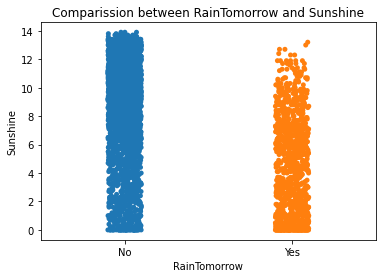

In [92]:
plt.title("Comparission between RainTomorrow and Sunshine")
sns.stripplot(x="RainTomorrow", y= "Sunshine", data = rwf_df)
plt.show()

there is no significant between the feature, here both the features are in equal length

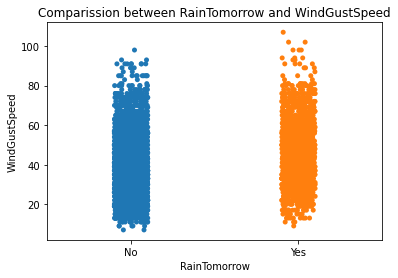

In [93]:
plt.title("Comparission between RainTomorrow and WindGustSpeed")
sns.stripplot(x="RainTomorrow", y= "WindGustSpeed", data = rwf_df)
plt.show()

we can observe that high wind speed the possiblity of RainTomorrow is 50-50

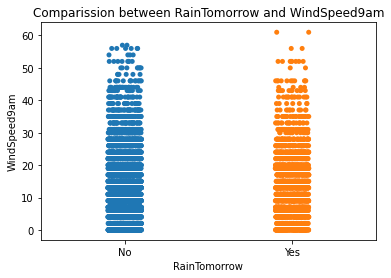

In [94]:
plt.title("Comparission between RainTomorrow and WindSpeed9am")
sns.stripplot(x="RainTomorrow", y= "WindSpeed9am", data = rwf_df)
plt.show()

we can observe that the windspeed 9am the possiblity of RainTomorrow is less

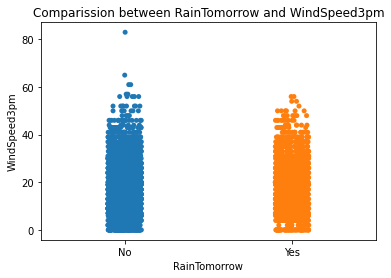

In [95]:
plt.title("Comparission between RainTomorrow and WindSpeed3pm")
sns.stripplot(x="RainTomorrow", y= "WindSpeed3pm", data = rwf_df)
plt.show()

we can observe that high wind speed 3pm the possiblity of RainTomorrow is 50-50

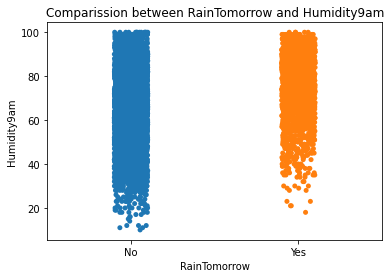

In [96]:
plt.title("Comparission between RainTomorrow and Humidity9am")
sns.stripplot(x="RainTomorrow", y= "Humidity9am", data = rwf_df)
plt.show()

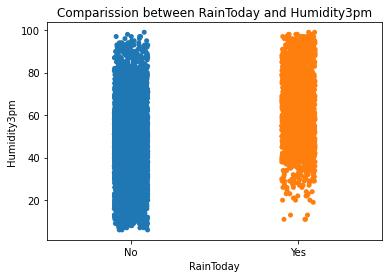

In [50]:
plt.title("Comparission between RainToday and Humidity3pm")
sns.stripplot(x="RainToday", y= "Humidity3pm", data = rwf_df)
plt.show()

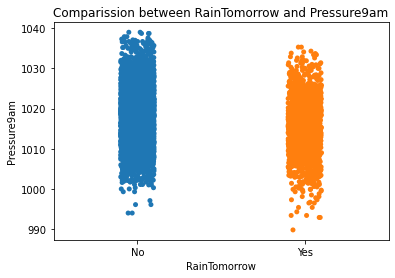

In [97]:
plt.title("Comparission between RainTomorrow and Pressure9am")
sns.stripplot(x="RainTomorrow", y= "Pressure9am", data = rwf_df)
plt.show()

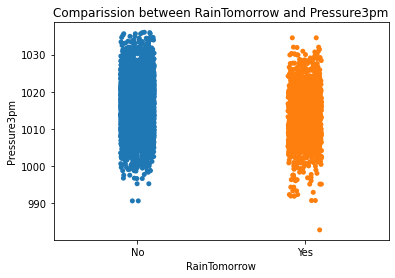

In [98]:
plt.title("Comparission between RainTomorrow and Pressure3pm")
sns.stripplot(x="RainTomorrow", y= "Pressure3pm", data = rwf_df)
plt.show()

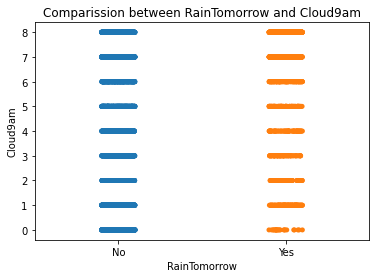

In [99]:
plt.title("Comparission between RainTomorrow and Cloud9am")
sns.stripplot(x="RainTomorrow", y= "Cloud9am", data = rwf_df)
plt.show()

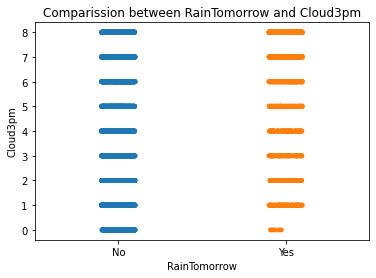

In [100]:
plt.title("Comparission between RainTomorrow and Cloud3pm")
sns.stripplot(x="RainTomorrow", y= "Cloud3pm", data = rwf_df)
plt.show()

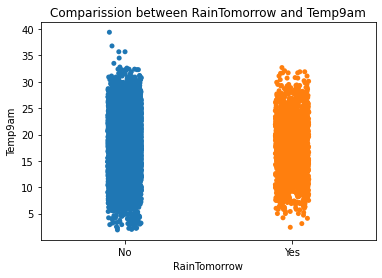

In [101]:
plt.title("Comparission between RainTomorrow and Temp9am")
sns.stripplot(x="RainTomorrow", y= "Temp9am", data = rwf_df)
plt.show()

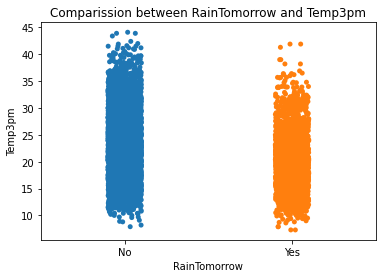

In [102]:
plt.title("Comparission between RainTomorrow and Temp3pm")
sns.stripplot(x="RainTomorrow", y= "Temp3pm", data = rwf_df)
plt.show()

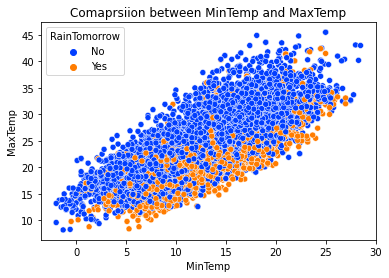

In [103]:
plt.title("Comaprsiion between MinTemp and MaxTemp")
sns.scatterplot(x = 'MinTemp', y = 'MaxTemp', data = rwf_df, hue = 'RainTomorrow', palette ='bright')
plt.show()

Here we can notice that strong linear relation between the temp.

As the mimtemp increses, maxtemp also increases rapidly, if the raintoday have low if the mintemp & max temp is leass and also rain today is high when a max & min tep is high

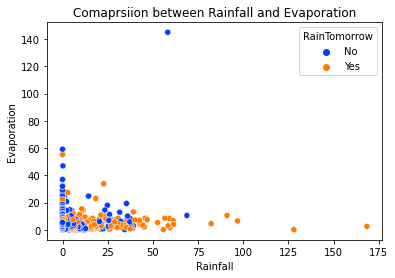

In [104]:
plt.title("Comaprsiion between Rainfall and Evaporation")
sns.scatterplot(x = 'Rainfall', y = 'Evaporation', data = rwf_df, hue = 'RainTomorrow', palette ='bright')
plt.show()

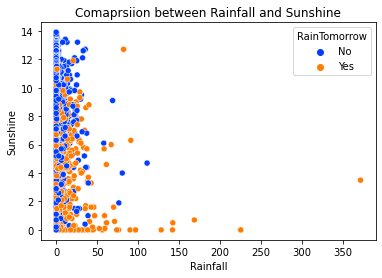

In [105]:
plt.title("Comaprsiion between Rainfall and Sunshine")
sns.scatterplot(x = 'Rainfall', y = 'Sunshine', data = rwf_df, hue = 'RainTomorrow', palette ='bright')
plt.show()

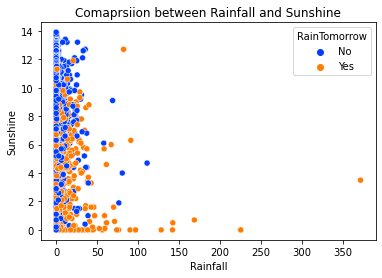

In [106]:
plt.title("Comaprsiion between Rainfall and Sunshine")
sns.scatterplot(x = 'Rainfall', y = 'Sunshine', data = rwf_df, hue = 'RainTomorrow', palette ='bright')
plt.show()

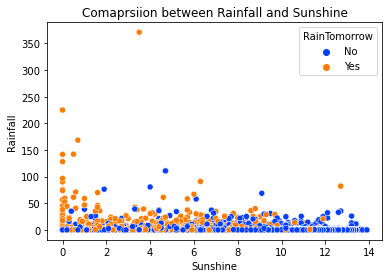

In [107]:
plt.title("Comaprsiion between Rainfall and Sunshine")
sns.scatterplot(x = 'Sunshine', y = 'Rainfall', data = rwf_df, hue = 'RainTomorrow', palette ='bright')
plt.show()

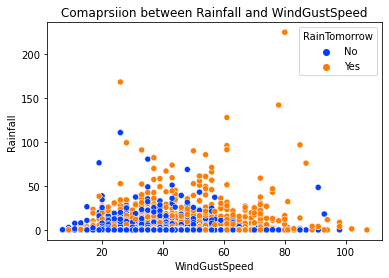

In [108]:
plt.title("Comaprsiion between Rainfall and WindGustSpeed")
sns.scatterplot(x = 'WindGustSpeed', y = 'Rainfall', data = rwf_df, hue = 'RainTomorrow', palette ='bright')
plt.show()

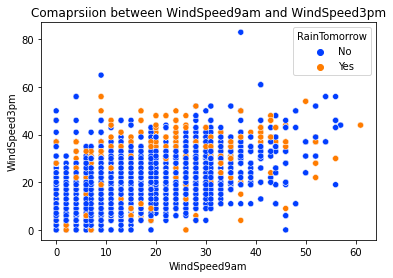

In [109]:
plt.title("Comaprsiion between WindSpeed9am and WindSpeed3pm")
sns.scatterplot(x = 'WindSpeed9am', y = 'WindSpeed3pm', data = rwf_df, hue = 'RainTomorrow', palette ='bright')
plt.show()

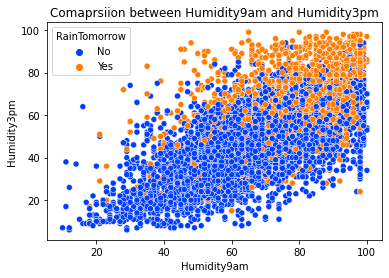

In [110]:
plt.title("Comaprsiion between Humidity9am and Humidity3pm")
sns.scatterplot(x = 'Humidity9am', y = 'Humidity3pm', data = rwf_df, hue = 'RainTomorrow', palette ='bright')
plt.show()

Here we can notice that strong linear relation between the humudity.

As the Humidity increses9am , humidity 3pm also increases rapidly, if the raintoday have low if the humidity 9am & 3pm is leass and also rain today is high when a max @ 9am & 3pm

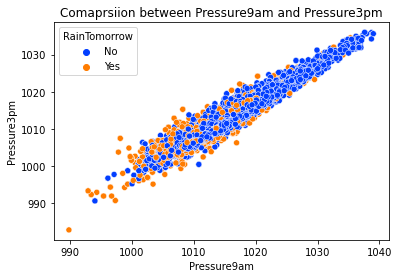

In [111]:
plt.title("Comaprsiion between Pressure9am and Pressure3pm")
sns.scatterplot(x = 'Pressure9am', y = 'Pressure3pm', data = rwf_df, hue = 'RainTomorrow', palette ='bright')
plt.show()

Here we can notice that strong linear relation between the pressure.

As the pressure increses9am , pressure 3pm also increases rapidly, if the rain today is less if the presure 9am & 3pm is leass and also rain today is high when a pressure is  max @ 9am & 3pm

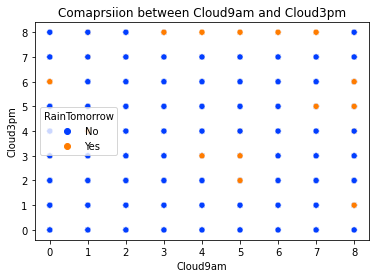

In [112]:
plt.title("Comaprsiion between Cloud9am and Cloud3pm")
sns.scatterplot(x = 'Cloud9am', y = 'Cloud3pm', data = rwf_df, hue = 'RainTomorrow', palette ='bright')
plt.show()

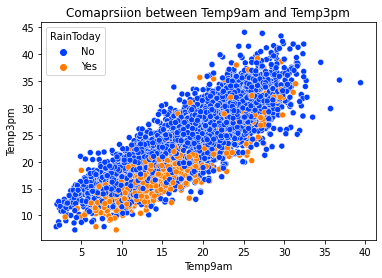

In [70]:
plt.title("Comaprsiion between Temp9am and Temp3pm")
sns.scatterplot(x = 'Temp9am', y = 'Temp3pm', data = rwf_df, hue = 'RainToday', palette ='bright')
plt.show()

Here we can notice that strong linear relation between the Temp.

As the Temp increses9am , Temp 3pm also increases rapidly, if the rain today is less if the Temp 9am & 3pm is less and also rain today is high when a Temp is max @ 9am & 3pm

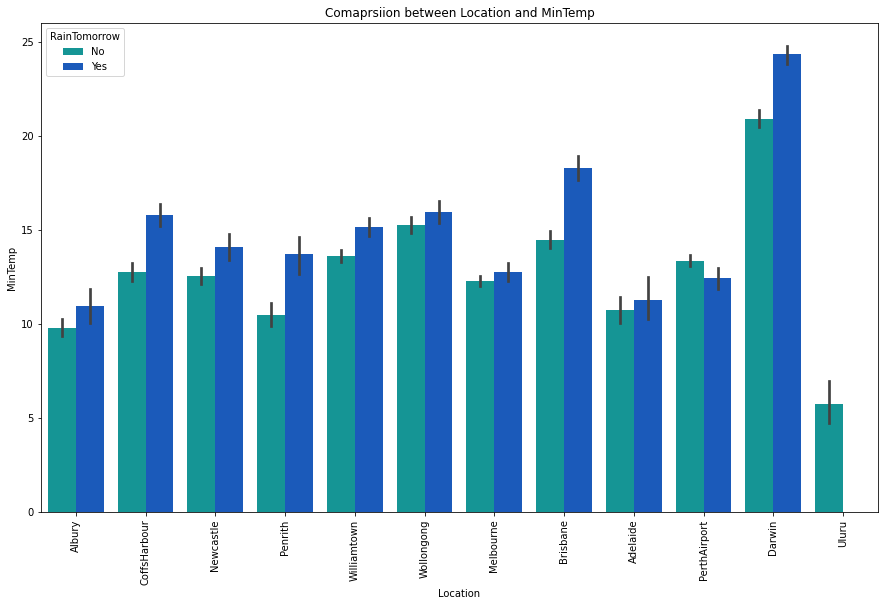

In [113]:
plt.figure(figsize=(15, 9))
plt.title("Comaprsiion between Location and MinTemp")
sns.barplot(x = 'Location', y = 'MinTemp', data = rwf_df, hue = 'RainTomorrow', palette ='winter_r')
plt.xticks(rotation=90)
plt.show()

the above graph shows rain today is high @ Darwin

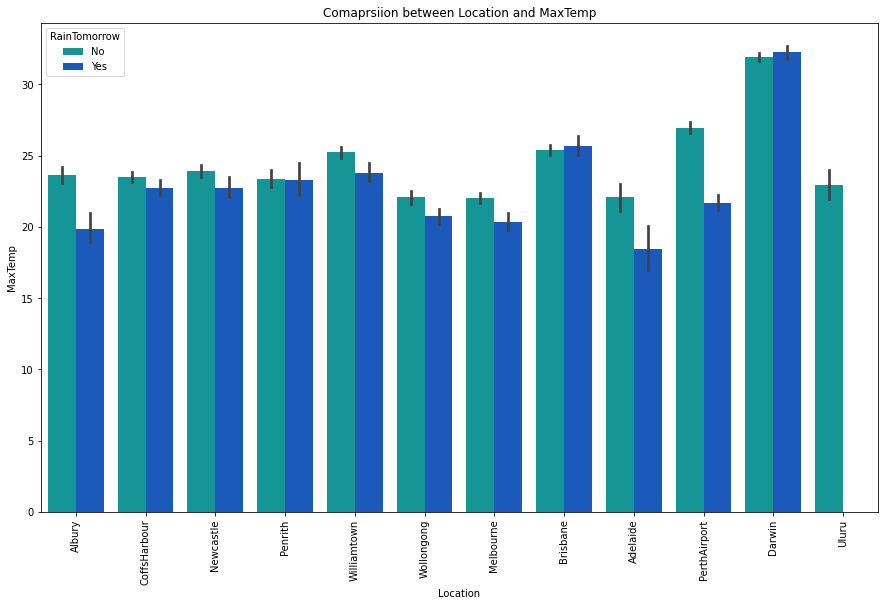

In [114]:
plt.figure(figsize=(15, 9))
plt.title("Comaprsiion between Location and MaxTemp")
sns.barplot(x = 'Location', y = 'MaxTemp', data = rwf_df, hue = 'RainTomorrow', palette ='winter_r')
plt.xticks(rotation=90)
plt.show()

In the baove graph shows that raintoday is high when temp is also high

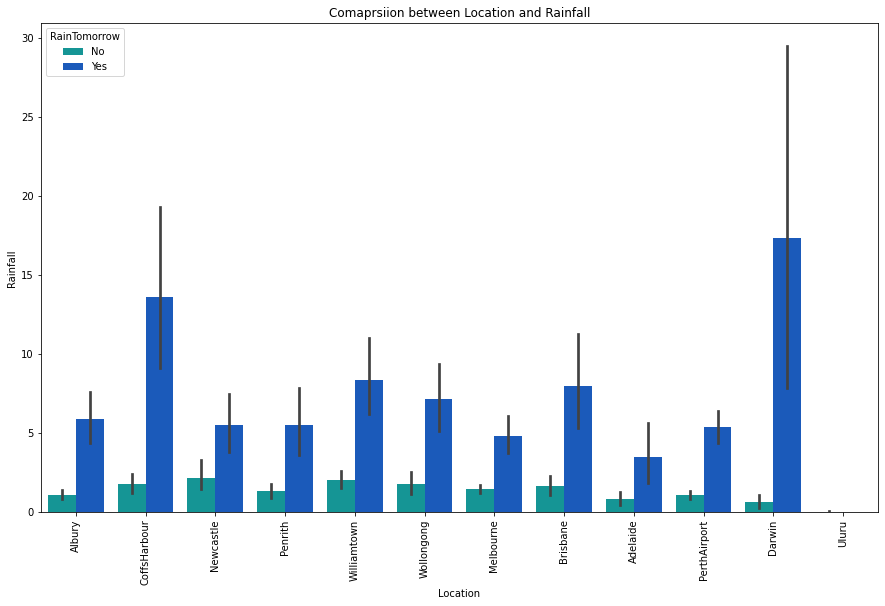

In [115]:
plt.figure(figsize=(15, 9))
plt.title("Comaprsiion between Location and Rainfall")
sns.barplot(x = 'Location', y = 'Rainfall', data = rwf_df, hue = 'RainTomorrow', palette ='winter_r')
plt.xticks(rotation=90)
plt.show()

we can observe that highest rainfall occured at Darwin

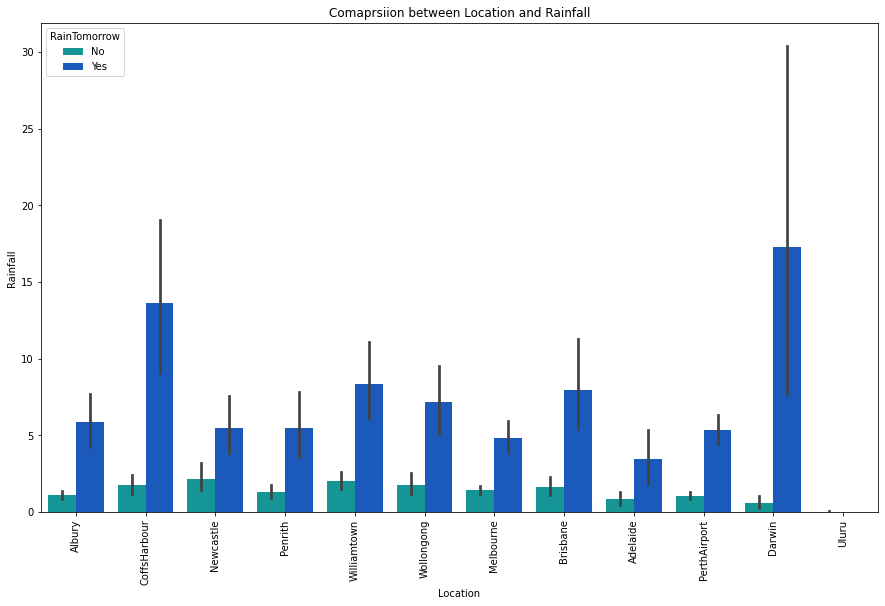

In [116]:
plt.figure(figsize=(15, 9))
plt.title("Comaprsiion between Location and Rainfall")
sns.barplot(x = 'Location', y = 'Rainfall', data = rwf_df, hue = 'RainTomorrow', palette ='winter_r')
plt.xticks(rotation=90)
plt.show()

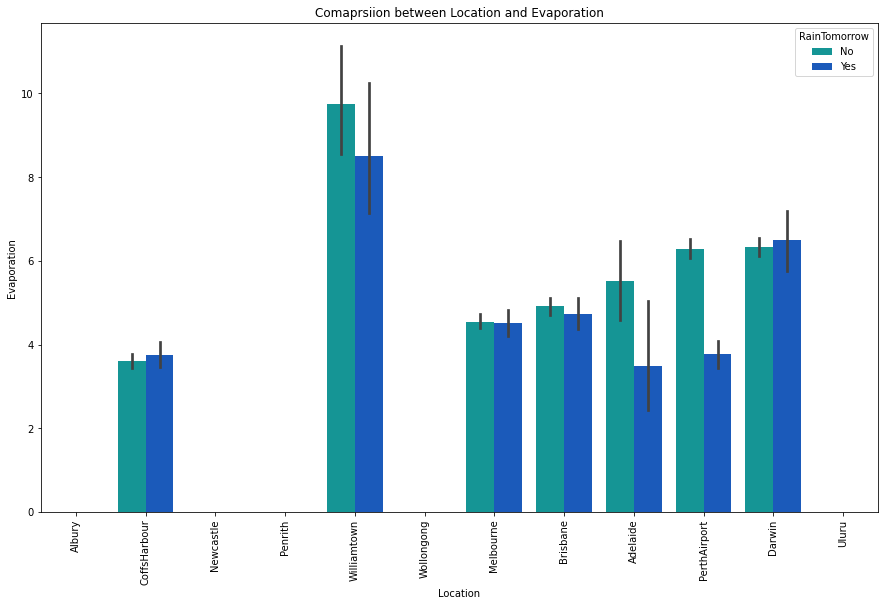

In [117]:
plt.figure(figsize=(15, 9))
plt.title("Comaprsiion between Location and Evaporation")
sns.barplot(x = 'Location', y = 'Evaporation', data = rwf_df, hue = 'RainTomorrow', palette ='winter_r')
plt.xticks(rotation=90)
plt.show()

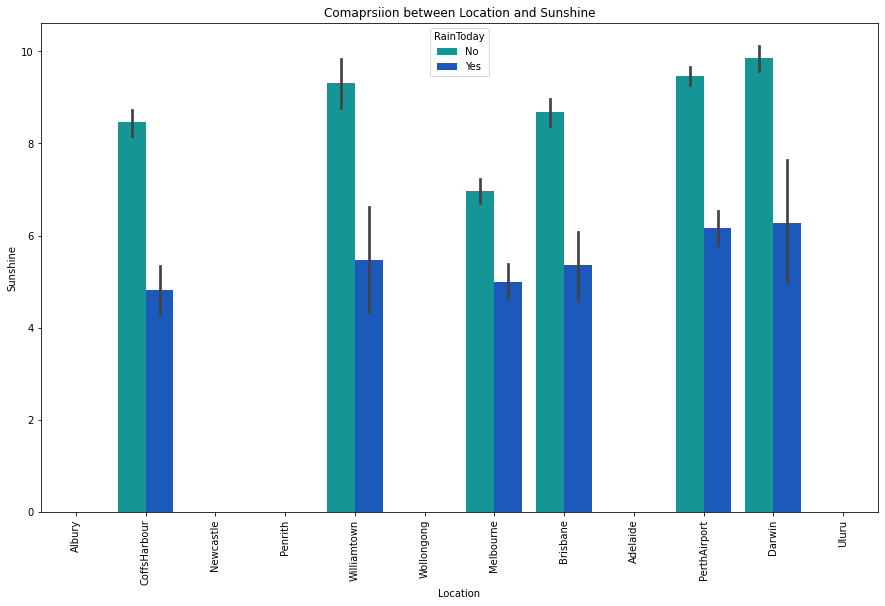

In [79]:
plt.figure(figsize=(15, 9))
plt.title("Comaprsiion between Location and Sunshine")
sns.barplot(x = 'Location', y = 'Sunshine', data = rwf_df, hue = 'RainToday', palette ='winter_r')
plt.xticks(rotation=90)
plt.show()

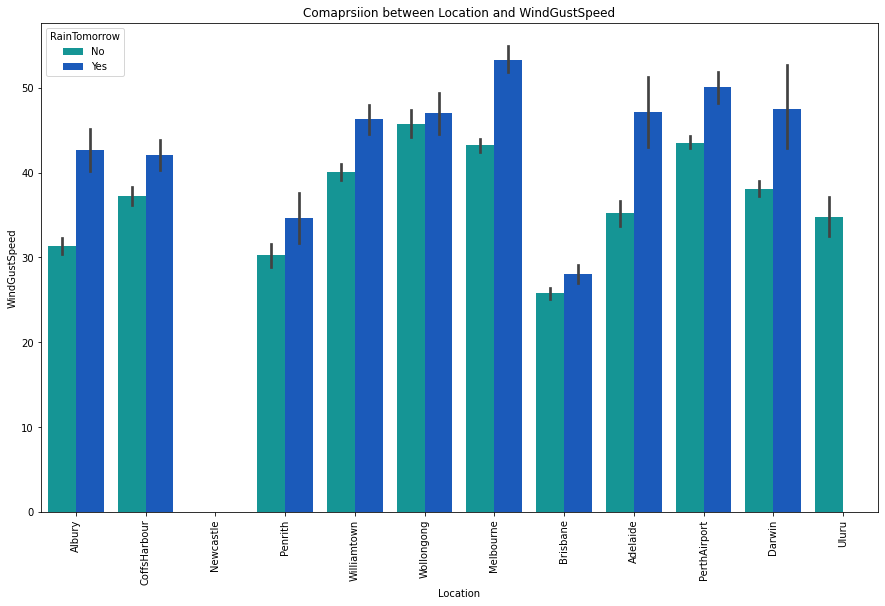

In [118]:
plt.figure(figsize=(15, 9))
plt.title("Comaprsiion between Location and WindGustSpeed")
sns.barplot(x = 'Location', y = 'WindGustSpeed', data = rwf_df, hue = 'RainTomorrow', palette ='winter_r')
plt.xticks(rotation=90)
plt.show()

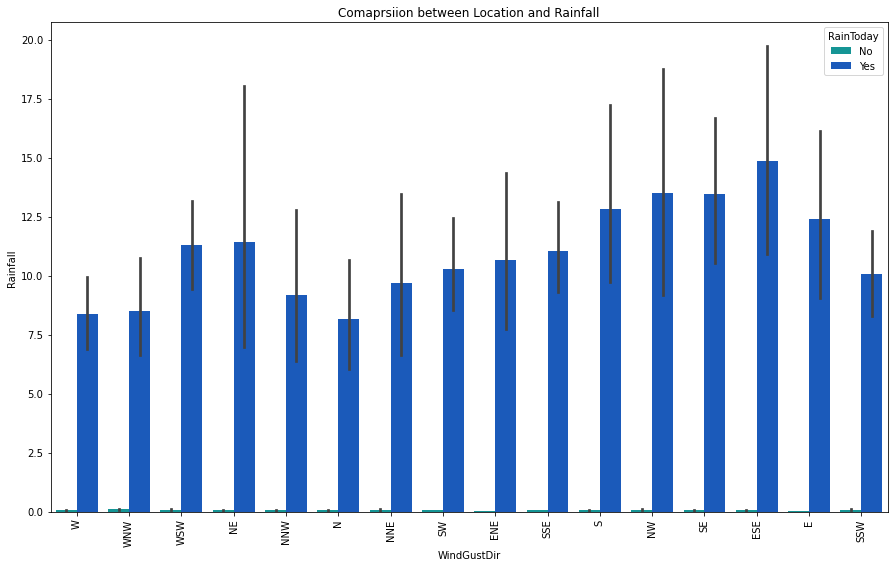

In [82]:
plt.figure(figsize=(15, 9))
plt.title("Comaprsiion between Location and Rainfall")
sns.barplot(x = 'WindGustDir', y = 'Rainfall', data = rwf_df, hue = 'RainToday', palette ='winter_r')
plt.xticks(rotation=90)
plt.show()

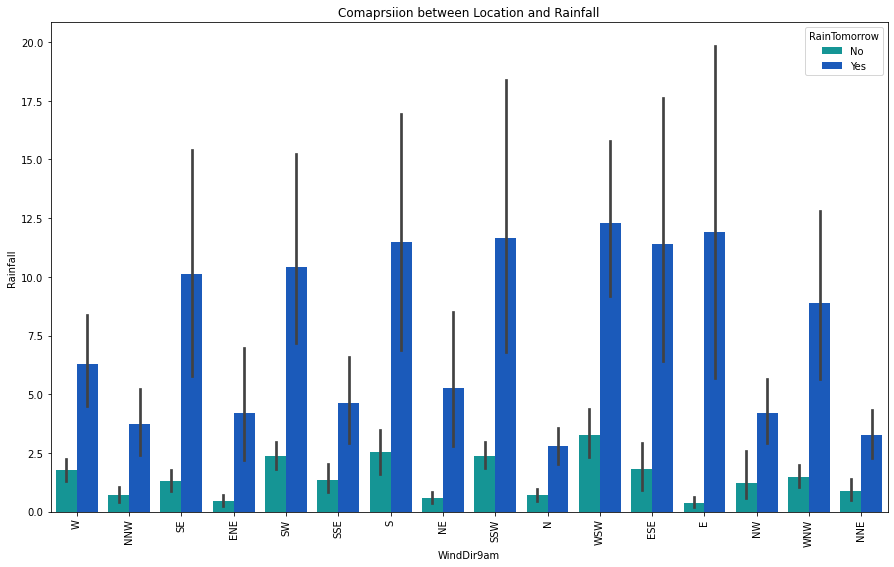

In [119]:
plt.figure(figsize=(15, 9))
plt.title("Comaprsiion between Location and Rainfall")
sns.barplot(x = 'WindDir9am', y = 'Rainfall', data = rwf_df, hue = 'RainTomorrow', palette ='winter_r')
plt.xticks(rotation=90)
plt.show()

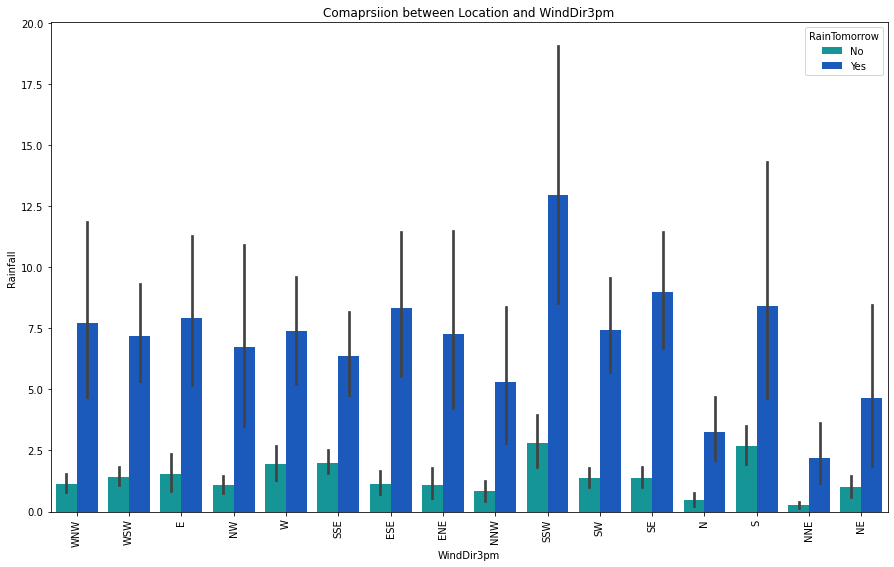

In [120]:
plt.figure(figsize=(15, 9))
plt.title("Comaprsiion between Location and WindDir3pm")
sns.barplot(x = 'WindDir3pm', y = 'Rainfall', data = rwf_df, hue = 'RainTomorrow', palette ='winter_r')
plt.xticks(rotation=90)
plt.show()

# Multivariate Analysis

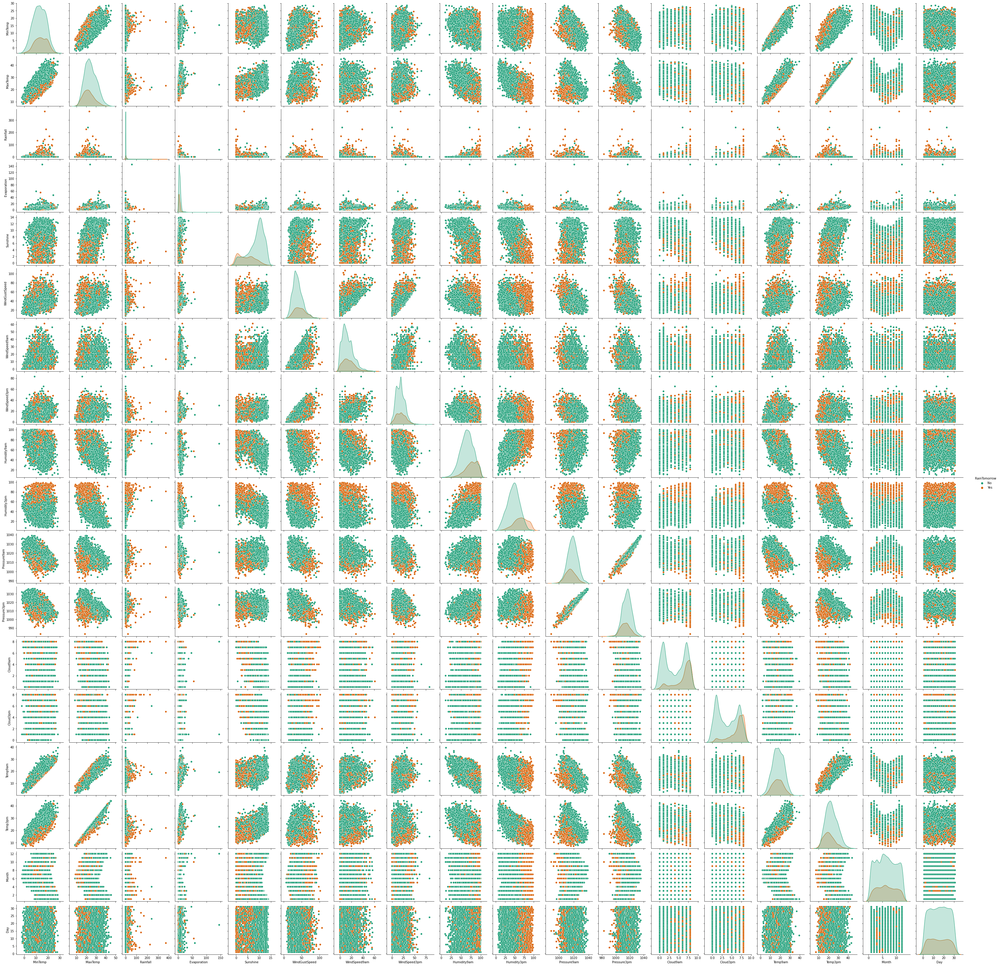

In [121]:
#for more than two coloumns using multivariate
sns.pairplot(rwf_df, hue="RainTomorrow", palette="Dark2")
plt.show()

In [122]:
#Separting Numerical and categorical column

#checking for Categorical columns
categorical_col = []
for i in rwf_df.dtypes.index:
    if rwf_df.dtypes[i] == "object":     #dtypes[i]-dtypes of any columns object it will append that columns in empty list 
        categorical_col.append(i)    #append method is used to add the value in your existing list
print("Categorical Columns:", categorical_col)
print("\n")

#Checking for Numerical columns
#Explanatory mark is used for not- when the condition my datatype is not object in that time  
#cont--is not satisifed in that time it append the numerical list
numerical_col = []        #creating empty list
for i in rwf_df.dtypes.index:
    if rwf_df.dtypes[i]!='object':      
        numerical_col.append(i)
print("Numerical Columns:", numerical_col)

Categorical Columns: ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Numerical Columns: ['Date', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Month', 'Day']


# Missing value imputation

In [123]:
rwf_df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
Month               0
Day                 0
dtype: int64

There are missing values in Gdifferent columns

We will treat the missing values in all the features one by one.

We can consider these methods to fill the missing values:

For numerical variables: imputation using mean or median

For categorical variables: imputation using mode


Categorical variables: 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow' imputation using mode

For numerical variables: 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm' imputation using mode





In [124]:
rwf_df['WindGustDir'].fillna(rwf_df['WindGustDir'].mode()[0], inplace=True)
rwf_df['WindDir9am'].fillna(rwf_df['WindDir9am'].mode()[0], inplace=True)
rwf_df['WindDir3pm'].fillna(rwf_df['WindDir3pm'].mode()[0], inplace=True)
rwf_df['RainToday'].fillna(rwf_df['RainToday'].mode()[0], inplace=True)
rwf_df['RainTomorrow'].fillna(rwf_df['RainTomorrow'].mode()[0], inplace=True)

In [125]:
rwf_df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir         0
WindGustSpeed     991
WindDir9am          0
WindDir3pm          0
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday           0
RainTomorrow        0
Month               0
Day                 0
dtype: int64

In [127]:
columns_to_fill = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

for column in columns_to_fill:
    if rwf_df[column].isnull().any():
        rwf_df[column].fillna(rwf_df[column].mode()[0], inplace=True)

In [128]:
rwf_df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Month            0
Day              0
dtype: int64

In [130]:
rwf_df.skew()

MinTemp          -0.084104
MaxTemp           0.391512
Rainfall         13.200523
Evaporation      13.812740
Sunshine          0.606448
WindGustSpeed     0.786153
WindSpeed9am      0.969604
WindSpeed3pm      0.510765
Humidity9am      -0.262767
Humidity3pm       0.110858
Pressure9am       0.171566
Pressure3pm      -0.190150
Cloud9am         -0.863322
Cloud3pm         -0.804407
Temp9am          -0.005160
Temp3pm           0.412119
Month             0.039388
Day               0.004260
dtype: float64

In [131]:
#Removing skewness using cuberoot method

rwf_df['Rainfall']=np.cbrt(rwf_df['Rainfall'])
rwf_df['Evaporation']=np.cbrt(rwf_df['Evaporation'])

In [132]:
rwf_df.skew()

MinTemp         -0.084104
MaxTemp          0.391512
Rainfall         1.762561
Evaporation      0.825759
Sunshine         0.606448
WindGustSpeed    0.786153
WindSpeed9am     0.969604
WindSpeed3pm     0.510765
Humidity9am     -0.262767
Humidity3pm      0.110858
Pressure9am      0.171566
Pressure3pm     -0.190150
Cloud9am        -0.863322
Cloud3pm        -0.804407
Temp9am         -0.005160
Temp3pm          0.412119
Month            0.039388
Day              0.004260
dtype: float64

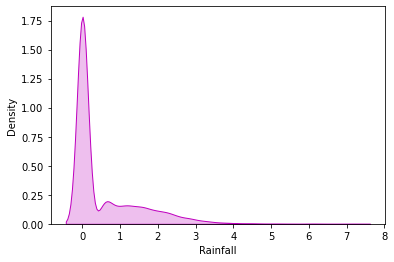

In [133]:
sns.distplot(rwf_df['Rainfall'], color="m", kde_kws={"shade":True}, hist = False)
plt.show()

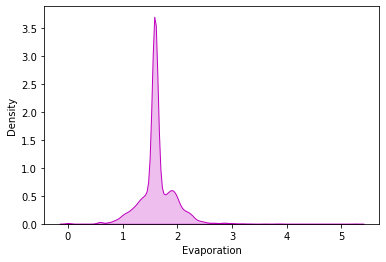

In [134]:
sns.distplot(rwf_df['Evaporation'], color="m", kde_kws={"shade":True}, hist = False)
plt.show()

This looks almost normal and skewness is also removed

In [135]:
rwf_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           8425 non-null   datetime64[ns]
 1   Location       8425 non-null   object        
 2   MinTemp        8425 non-null   float64       
 3   MaxTemp        8425 non-null   float64       
 4   Rainfall       8425 non-null   float64       
 5   Evaporation    8425 non-null   float64       
 6   Sunshine       8425 non-null   float64       
 7   WindGustDir    8425 non-null   object        
 8   WindGustSpeed  8425 non-null   float64       
 9   WindDir9am     8425 non-null   object        
 10  WindDir3pm     8425 non-null   object        
 11  WindSpeed9am   8425 non-null   float64       
 12  WindSpeed3pm   8425 non-null   float64       
 13  Humidity9am    8425 non-null   float64       
 14  Humidity3pm    8425 non-null   float64       
 15  Pressure9am    8425 n

Encoding categorical columns

In [136]:
from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in rwf_df.columns:   #using for loop itrating through the columns
    if rwf_df[i].dtypes=='object':   #and if the datatypes is object
        rwf_df[i] = OE.fit_transform(rwf_df[i].values.reshape(-1, 1)) #i am using ordinal encoder to fit transformation after that i am using the reshapping the value
rwf_df


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,2008-12-01,1.0,13.4,22.9,0.843433,1.587401,0.0,13.0,44.0,13.0,...,1007.7,1007.1,8.0,7.0,16.9,21.8,0.0,0.0,12,1
1,2008-12-02,1.0,7.4,25.1,0.000000,1.587401,0.0,14.0,44.0,6.0,...,1010.6,1007.8,7.0,7.0,17.2,24.3,0.0,0.0,12,2
2,2008-12-03,1.0,12.9,25.7,0.000000,1.587401,0.0,15.0,46.0,13.0,...,1007.6,1008.7,7.0,2.0,21.0,23.2,0.0,0.0,12,3
3,2008-12-04,1.0,9.2,28.0,0.000000,1.587401,0.0,4.0,24.0,9.0,...,1017.6,1012.8,7.0,7.0,18.1,26.5,0.0,0.0,12,4
4,2008-12-05,1.0,17.5,32.3,1.000000,1.587401,0.0,13.0,41.0,1.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,9.0,2.8,23.4,0.000000,1.587401,0.0,0.0,31.0,9.0,...,1024.6,1020.3,7.0,7.0,10.1,22.4,0.0,0.0,6,21
8421,2017-06-22,9.0,3.6,25.3,0.000000,1.587401,0.0,6.0,22.0,9.0,...,1023.5,1019.1,7.0,7.0,10.9,24.5,0.0,0.0,6,22
8422,2017-06-23,9.0,5.4,26.9,0.000000,1.587401,0.0,3.0,37.0,9.0,...,1021.0,1016.8,7.0,7.0,12.5,26.1,0.0,0.0,6,23
8423,2017-06-24,9.0,7.8,27.0,0.000000,1.587401,0.0,9.0,28.0,10.0,...,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,0.0,6,24


we have converted the categrical columns into numerical columns using Ordinal Encoding method

In [137]:
rwf_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           8425 non-null   datetime64[ns]
 1   Location       8425 non-null   float64       
 2   MinTemp        8425 non-null   float64       
 3   MaxTemp        8425 non-null   float64       
 4   Rainfall       8425 non-null   float64       
 5   Evaporation    8425 non-null   float64       
 6   Sunshine       8425 non-null   float64       
 7   WindGustDir    8425 non-null   float64       
 8   WindGustSpeed  8425 non-null   float64       
 9   WindDir9am     8425 non-null   float64       
 10  WindDir3pm     8425 non-null   float64       
 11  WindSpeed9am   8425 non-null   float64       
 12  WindSpeed3pm   8425 non-null   float64       
 13  Humidity9am    8425 non-null   float64       
 14  Humidity3pm    8425 non-null   float64       
 15  Pressure9am    8425 n

In [149]:
rwf_df.head(100)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,2008-12-01,1.0,13.4,22.9,0.843433,1.587401,0.0,13.0,44.0,13.0,...,1007.7,1007.1,8.0,7.0,16.9,21.8,0.0,0.0,12,1
1,2008-12-02,1.0,7.4,25.1,0.000000,1.587401,0.0,14.0,44.0,6.0,...,1010.6,1007.8,7.0,7.0,17.2,24.3,0.0,0.0,12,2
2,2008-12-03,1.0,12.9,25.7,0.000000,1.587401,0.0,15.0,46.0,13.0,...,1007.6,1008.7,7.0,2.0,21.0,23.2,0.0,0.0,12,3
3,2008-12-04,1.0,9.2,28.0,0.000000,1.587401,0.0,4.0,24.0,9.0,...,1017.6,1012.8,7.0,7.0,18.1,26.5,0.0,0.0,12,4
4,2008-12-05,1.0,17.5,32.3,1.000000,1.587401,0.0,13.0,41.0,1.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2009-03-06,1.0,7.6,24.0,0.000000,1.587401,0.0,15.0,30.0,3.0,...,1014.5,1012.0,7.0,7.0,12.6,22.0,0.0,0.0,3,6
96,2009-03-07,1.0,8.3,27.9,0.000000,1.587401,0.0,13.0,37.0,8.0,...,1015.2,1012.4,7.0,7.0,13.3,27.0,0.0,0.0,3,7
97,2009-03-08,1.0,11.0,30.2,0.000000,1.587401,0.0,10.0,24.0,0.0,...,1017.0,1014.7,7.0,7.0,17.6,28.8,0.0,0.0,3,8
98,2009-03-09,1.0,13.8,31.8,0.000000,1.587401,0.0,5.0,24.0,10.0,...,1019.7,1015.9,7.0,7.0,18.6,30.5,0.0,0.0,3,9


In [138]:
#Statistical summary of numerical
rwf_df.describe()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,...,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,5.793591,13.182682,23.825365,0.539003,1.625292,4.014042,7.217804,40.036320,7.267418,7.810445,...,1017.198944,1015.635347,5.265875,5.230742,17.742326,22.405982,0.236202,0.236320,6.442136,15.741958
std,3.162654,5.380656,6.128159,0.896558,0.317205,4.744297,4.702616,13.781296,4.588045,4.430162,...,6.359552,6.286580,2.667166,2.564122,5.613463,5.955804,0.424773,0.424846,3.437994,8.787354
min,0.000000,-2.000000,8.200000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,...,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,0.000000,0.000000,1.000000,1.000000
25%,3.000000,9.300000,19.200000,0.000000,1.587401,0.000000,3.000000,31.000000,3.000000,4.000000,...,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,0.000000,0.000000,3.000000,8.000000
50%,6.000000,13.200000,23.200000,0.000000,1.587401,0.200000,7.000000,39.000000,7.000000,8.000000,...,1016.100000,1017.000000,7.000000,7.000000,17.700000,21.800000,0.000000,0.000000,6.000000,16.000000
75%,8.000000,17.300000,28.000000,0.928318,1.732478,8.900000,12.000000,48.000000,12.000000,11.000000,...,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,0.000000,0.000000,9.000000,23.000000
max,11.000000,28.500000,45.500000,7.185516,5.253588,13.900000,15.000000,107.000000,15.000000,15.000000,...,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,1.000000,1.000000,12.000000,31.000000


After Encoding the categorical columns we can see all column details here. The Counts of all the columns are same taht means no null values in the datset This describemethod describe the count, mean,st,min,IQR, and max values of all the columns

Correlation Between target varuiable and Independent variable

In [139]:
cor = rwf_df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
Location,1.000000,0.116244,0.063727,0.011409,0.123542,-0.093480,-0.035408,0.230018,-0.027103,-0.027736,...,-0.044545,-0.009161,0.033864,0.008465,0.117040,0.059716,0.003071,0.002824,-0.082407,-0.002019
MinTemp,0.116244,1.000000,0.716554,0.085637,0.372746,0.136892,-0.143821,0.230313,-0.040171,-0.147337,...,-0.411773,-0.428689,0.016539,-0.038681,0.886777,0.687180,0.065191,0.092657,-0.245593,0.009422
MaxTemp,0.063727,0.716554,1.000000,-0.219095,0.459448,0.290243,-0.219104,0.139978,-0.210728,-0.180844,...,-0.315410,-0.402141,-0.242281,-0.242989,0.864741,0.973412,-0.222793,-0.150733,-0.161232,0.016050
Rainfall,0.011409,0.085637,-0.219095,1.000000,-0.133853,-0.166598,0.117051,0.088014,0.161316,0.102845,...,-0.116431,-0.036464,0.224846,0.185319,-0.084472,-0.228416,0.881651,0.341840,-0.013116,-0.016216
Evaporation,0.123542,0.372746,0.459448,-0.133853,1.000000,0.245247,-0.094538,0.192098,-0.061552,-0.049134,...,-0.237597,-0.269033,-0.138296,-0.163467,0.451158,0.446216,-0.151892,-0.082045,-0.004633,0.017989
Sunshine,-0.093480,0.136892,0.290243,-0.166598,0.245247,1.000000,-0.055204,0.082179,-0.013584,-0.062728,...,0.056912,-0.086103,-0.574466,-0.545069,0.267029,0.288894,-0.144715,-0.197937,0.019281,0.007805
WindGustDir,-0.035408,-0.143821,-0.219104,0.117051,-0.094538,-0.055204,1.000000,0.025577,0.403562,0.505799,...,-0.071336,-0.058467,0.164227,0.127633,-0.173622,-0.233015,0.125188,0.051832,0.034823,0.015683
WindGustSpeed,0.230018,0.230313,0.139978,0.088014,0.192098,0.082179,0.025577,1.000000,-0.068545,0.070677,...,-0.382116,-0.385564,-0.004122,0.031616,0.202291,0.102218,0.076890,0.190274,0.051063,-0.002454
WindDir9am,-0.027103,-0.040171,-0.210728,0.161316,-0.061552,-0.013584,0.403562,-0.068545,1.000000,0.249527,...,0.010892,0.052802,0.098501,0.066539,-0.099944,-0.217929,0.157324,0.032860,0.012544,-0.015154
WindDir3pm,-0.027736,-0.147337,-0.180844,0.102845,-0.049134,-0.062728,0.505799,0.070677,0.249527,1.000000,...,-0.135785,-0.042155,0.087079,0.062069,-0.165367,-0.195979,0.100125,0.008918,0.029384,0.003089


This gives the correlation between the dependent and independent variables. WE can Visualize this by plotting heatmap

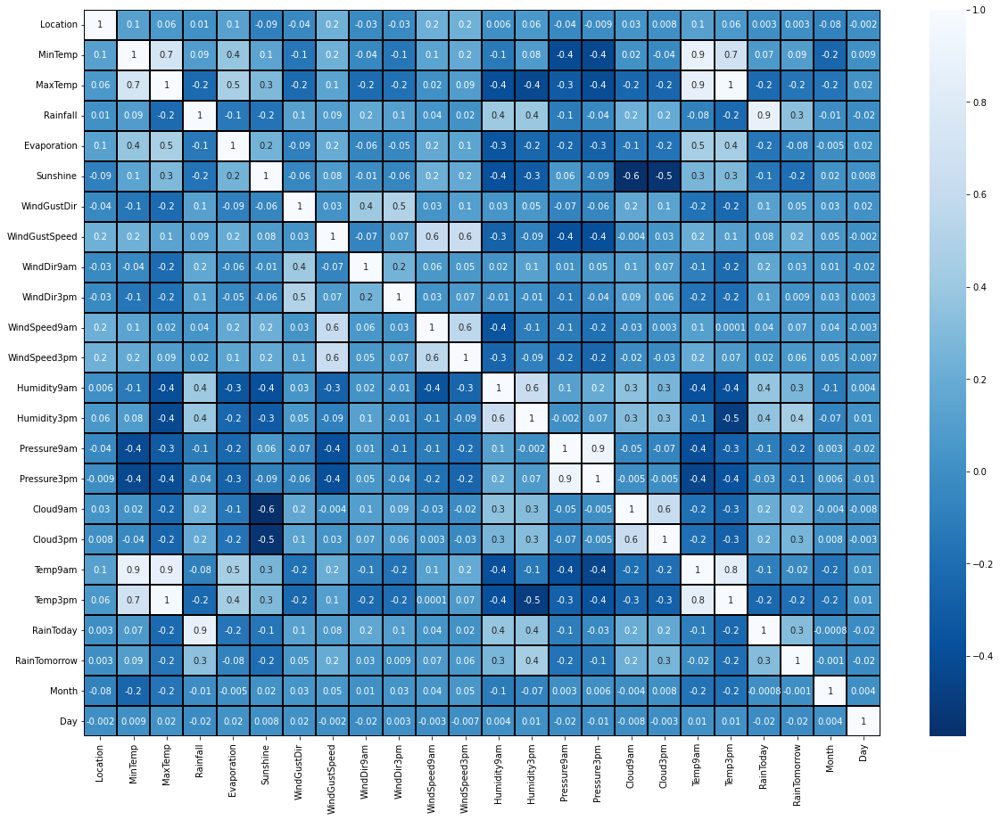

In [140]:
plt.figure(figsize = (20, 15))
sns.heatmap(rwf_df.corr(), linewidth = 0.1, fmt = ".1g", linecolor ="black", annot = True, cmap = "Blues_r")
plt.yticks(rotation= 0);
plt.show()

In [141]:
cor['RainTomorrow'].sort_values(ascending= False)

RainTomorrow     1.000000
Humidity3pm      0.444347
Rainfall         0.341840
RainToday        0.312929
Humidity9am      0.271396
Cloud3pm         0.261159
Cloud9am         0.216294
WindGustSpeed    0.190274
MinTemp          0.092657
WindSpeed9am     0.067943
WindSpeed3pm     0.055508
WindGustDir      0.051832
WindDir9am       0.032860
WindDir3pm       0.008918
Location         0.002824
Month           -0.001243
Day             -0.015461
Temp9am         -0.023597
Evaporation     -0.082045
Pressure3pm     -0.133191
MaxTemp         -0.150733
Pressure9am     -0.162406
Temp3pm         -0.192463
Sunshine        -0.197937
Name: RainTomorrow, dtype: float64

we can observe the positive and negative correlated feature with the target

Visualizing the correlation between label and feature using bar plot

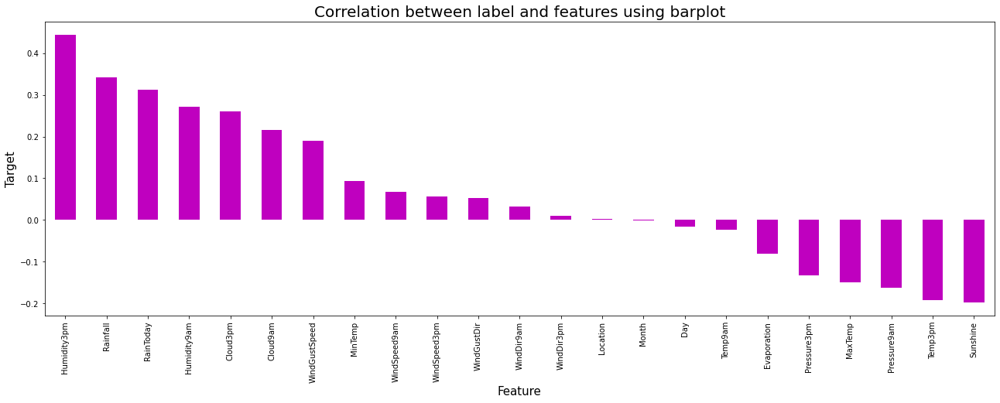

In [144]:
plt.figure(figsize = (22, 7))
rwf_df.corr()['RainTomorrow'].sort_values(ascending = False).drop(['RainTomorrow']).plot(kind='bar',color="m")
plt.xlabel('Feature', fontsize = 15)
plt.ylabel('Target', fontsize = 15)
plt.title("Correlation between label and features using barplot", fontsize=20)
plt.show()

from the above bar plot we can notice the positive and negative correlation between the feature and the target. Here the feature location and month & day have very less correlation with the columns

Separting the features and label

In [152]:
rwf_df.drop(['Date'],axis=1,inplace=True)

In [153]:
x = rwf_df.drop("RainTomorrow", axis = 1)
y = rwf_df["RainTomorrow"]

In [154]:
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Month,Day
0,1.0,13.4,22.9,0.843433,1.587401,0.0,13.0,44.0,13.0,14.0,...,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,0.0,12,1
1,1.0,7.4,25.1,0.000000,1.587401,0.0,14.0,44.0,6.0,15.0,...,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,0.0,12,2
2,1.0,12.9,25.7,0.000000,1.587401,0.0,15.0,46.0,13.0,15.0,...,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,0.0,12,3
3,1.0,9.2,28.0,0.000000,1.587401,0.0,4.0,24.0,9.0,0.0,...,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,0.0,12,4
4,1.0,17.5,32.3,1.000000,1.587401,0.0,13.0,41.0,1.0,7.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,0.000000,1.587401,0.0,0.0,31.0,9.0,1.0,...,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,0.0,6,21
8421,9.0,3.6,25.3,0.000000,1.587401,0.0,6.0,22.0,9.0,3.0,...,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,0.0,6,22
8422,9.0,5.4,26.9,0.000000,1.587401,0.0,3.0,37.0,9.0,14.0,...,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,0.0,6,23
8423,9.0,7.8,27.0,0.000000,1.587401,0.0,9.0,28.0,10.0,3.0,...,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,6,24


In [155]:
y

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
8420    0.0
8421    0.0
8422    0.0
8423    0.0
8424    0.0
Name: RainTomorrow, Length: 8425, dtype: float64

# Feature Scaling Standard Scalarization

In [156]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Month,Day
0,-1.515776,0.040391,-0.151011,0.339575,-0.119459,-0.846127,1.229643,0.287630,1.249535,1.397222,...,-1.599484,-1.493738,-1.357790,1.025166,0.690047,-0.150064,-0.101753,-0.556099,1.616696,-1.677733
1,-1.515776,-1.074781,0.208009,-0.601227,-0.119459,-0.846127,1.442303,0.287630,-0.276260,1.622961,...,-1.435688,-1.037704,-1.246435,0.650214,0.690047,-0.096617,0.318031,-0.556099,1.616696,-1.563926
2,-1.515776,-0.052540,0.305923,-0.601227,-0.119459,-0.846127,1.654964,0.432763,1.249535,1.622961,...,-1.162693,-1.509464,-1.103264,0.650214,-1.260055,0.580367,0.133326,-0.556099,1.616696,-1.450120
3,-1.515776,-0.740229,0.681262,-0.601227,-0.119459,-0.846127,-0.684299,-1.163698,0.377652,-1.763120,...,-1.927077,0.063067,-0.451043,0.650214,0.690047,0.063721,0.687441,-0.556099,1.616696,-1.336313
4,-1.515776,0.802425,1.382983,0.514217,-0.119459,-0.846127,1.229643,0.069931,-1.366114,-0.182949,...,-0.998897,-1.006254,-1.532776,0.650214,1.080067,0.010275,1.224763,-0.556099,1.616696,-1.222506
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,1.013895,-1.929746,-0.069416,-0.601227,-0.119459,-0.846127,-1.534940,-0.655733,0.377652,-1.537381,...,-1.490286,1.163839,0.742046,0.650214,0.690047,-1.361509,-0.001004,-0.556099,-0.128611,0.598400
8421,1.013895,-1.781056,0.240647,-0.601227,-0.119459,-0.846127,-0.258979,-1.308831,0.377652,-1.085904,...,-1.654083,0.990861,0.551152,0.650214,0.690047,-1.218986,0.351614,-0.556099,-0.128611,0.712207
8422,1.013895,-1.446505,0.501752,-0.601227,-0.119459,-0.846127,-0.896959,-0.220335,0.377652,1.397222,...,-1.490286,0.597728,0.185271,0.650214,0.690047,-0.933940,0.620275,-0.556099,-0.128611,0.826013
8423,1.013895,-1.000436,0.518071,-0.601227,-0.119459,-0.846127,0.379002,-0.873433,0.595623,-1.085904,...,-1.490286,0.346123,0.137548,-0.849595,-1.260055,-0.470740,0.603484,-0.556099,-0.128611,0.939820


Checking the variance Inflation Factor(VIF)

In [157]:
#Finding variance inflation factor in each scaled column i.e X.shape[1] (1/(1-R2))
#1st import library
#vif-x.values an the independent  variable
#for i the range -using range function itrates over the columns
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values, i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,1.195871,Location
1,8.192658,MinTemp
2,24.945772,MaxTemp
3,4.823611,Rainfall
4,1.404987,Evaporation
5,2.128955,Sunshine
6,1.625046,WindGustDir
7,2.482290,WindGustSpeed
8,1.324421,WindDir9am
9,1.490242,WindDir3pm


In [158]:
y.value_counts()

0.0    6434
1.0    1991
Name: RainTomorrow, dtype: int64

OverSampling

In [159]:
#OverSampling the data
#Smote is the one of the method to balnce the classes  using randum over smapling
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x,y = SM.fit_resample(x,y)

In [160]:
#Checking value count of target column
#the ratio is 1:1 
y.value_counts()

0.0    6434
1.0    6434
Name: RainTomorrow, dtype: int64

Now the data is balanced. Now we can build Machine learning classification models

Now EDS COMPLETED

* Import the libraries** do on graphical analysis graphivcal analysis Univariate analysis Bivariate analysis Multivariate analysis encode the categorical columns Check outliers and remove it if present check skewness and remove it if present check multicollinearity remove multicollinearity if present apply feature scaling method on numerical features apply resampling method to balnce the classes (in classification problems)

Also apply feature selection methods

# Modelling

Finding the best random State

In [161]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxAccu = 0
maxRS = 0
for i in range(1, 200):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state = i)
    RFR = RandomForestClassifier()
    RFR.fit(x_train, y_train)
    pred = RFR.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
print("Best accuaracy is ", maxAccu, "at random_state", maxRS)

Best accuaracy is  0.940947940947941 at random_state 87


Crating train test split

In [162]:
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size = 0.30, random_state = maxRS)

Classification Algorithms

In [163]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score


RandomForestclassifier

In [164]:
#Checking accuracy for RandomForestClasifier
RFC = RandomForestClassifier()
RFC.fit(x_train, y_train)
predRFC = RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test, predRFC))

0.9365449365449365
[[1781  148]
 [  97 1835]]
              precision    recall  f1-score   support

         0.0       0.95      0.92      0.94      1929
         1.0       0.93      0.95      0.94      1932

    accuracy                           0.94      3861
   macro avg       0.94      0.94      0.94      3861
weighted avg       0.94      0.94      0.94      3861



Logistic Regression

In [165]:
#Checking accuracy for LogisticRegression
LR = LogisticRegression()
LR.fit(x_train, y_train)
predLR = LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test, predLR))
print(classification_report(y_test, predLR))

0.7643097643097643
[[1500  429]
 [ 481 1451]]
              precision    recall  f1-score   support

         0.0       0.76      0.78      0.77      1929
         1.0       0.77      0.75      0.76      1932

    accuracy                           0.76      3861
   macro avg       0.76      0.76      0.76      3861
weighted avg       0.76      0.76      0.76      3861



In [166]:
#Checking accuracy for SupportVector Machine classifier
svc = SVC()
svc.fit(x_train, y_train)
predsvc = svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test, predsvc))

0.8549598549598549
[[1620  309]
 [ 251 1681]]
              precision    recall  f1-score   support

         0.0       0.87      0.84      0.85      1929
         1.0       0.84      0.87      0.86      1932

    accuracy                           0.85      3861
   macro avg       0.86      0.85      0.85      3861
weighted avg       0.86      0.85      0.85      3861



Gradient Boosting Classifier

In [167]:
#Checking accuracy for Gradient boosting classifier
GB = GradientBoostingClassifier()
GB.fit(x_train, y_train)
predGB = GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test, predGB))
print(classification_report(y_test, predGB))

0.8603988603988604
[[1659  270]
 [ 269 1663]]
              precision    recall  f1-score   support

         0.0       0.86      0.86      0.86      1929
         1.0       0.86      0.86      0.86      1932

    accuracy                           0.86      3861
   macro avg       0.86      0.86      0.86      3861
weighted avg       0.86      0.86      0.86      3861



AdaBoost Classifier

In [168]:
#Checking accuracy for Ada boost classifier
ABC = AdaBoostClassifier()
ABC.fit(x_train, y_train)
predABC = ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test, predABC))
print(classification_report(y_test, predABC))

0.8215488215488216
[[1588  341]
 [ 348 1584]]
              precision    recall  f1-score   support

         0.0       0.82      0.82      0.82      1929
         1.0       0.82      0.82      0.82      1932

    accuracy                           0.82      3861
   macro avg       0.82      0.82      0.82      3861
weighted avg       0.82      0.82      0.82      3861



BaggingClassifier

In [169]:
#Checking accuracy for Baggingclassifier
BC = BaggingClassifier()
BC.fit(x_train, y_train)
predBC = BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test, predBC))
print(classification_report(y_test, predBC))

0.9109039109039109
[[1779  150]
 [ 194 1738]]
              precision    recall  f1-score   support

         0.0       0.90      0.92      0.91      1929
         1.0       0.92      0.90      0.91      1932

    accuracy                           0.91      3861
   macro avg       0.91      0.91      0.91      3861
weighted avg       0.91      0.91      0.91      3861



ExtraTreesClassifier

In [170]:
#Checking accuracy for ExtraGTreeClassifier
ET = ExtraTreesClassifier()
ET.fit(x_train, y_train)
predET = ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test, predET))
print(classification_report(y_test, predET))

0.945091945091945
[[1794  135]
 [  77 1855]]
              precision    recall  f1-score   support

         0.0       0.96      0.93      0.94      1929
         1.0       0.93      0.96      0.95      1932

    accuracy                           0.95      3861
   macro avg       0.95      0.95      0.95      3861
weighted avg       0.95      0.95      0.95      3861



The accuracy scoreusing extraTreeClassifier is 94.50%

Cross Validation Score

In [171]:
from sklearn.model_selection import cross_val_score

In [172]:
#checking cv score for Rabdomforest clasifier
score = cross_val_score(RFC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predRFC) - score.mean())

[0.77933178 0.73426573 0.88111888 0.88146133 0.84998057]
0.8252316582670256
Difference between Accuracy score and cross validation score is- 0.11131327827791093


In [174]:
#checking cv score for Logistic Regression
score = cross_val_score(LR,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predLR) - score.mean())

[0.66045066 0.63947164 0.61616162 0.74115818 0.82588418]
0.6966252558168609
Difference between Accuracy score and cross validation score is- 0.06768450849290342


In [173]:
#checking cv score for Gradient Boosting classifier
score = cross_val_score(GB,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predGB) - score.mean())

[0.67560218 0.61499611 0.72455322 0.73804897 0.68480373]
0.6876008432557208
Difference between Accuracy score and cross validation score is- 0.17279801714313958


In [175]:
#checking cv score for Support vector Machine classifier
score = cross_val_score(svc,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predsvc) - score.mean())

[0.72377622 0.65423465 0.74436674 0.77885736 0.75242907]
0.7307328116888941
Difference between Accuracy score and cross validation score is- 0.12422704327096079


In [177]:
#checking cv score for AdaBoost classifier
score = cross_val_score(ABC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predABC) - score.mean())

[0.66122766 0.60722611 0.68065268 0.74154683 0.73105325]
0.6843413053673449
Difference between Accuracy score and cross validation score is- 0.13720751618147664


In [176]:
#checking cv score for Bagging classifier
score = cross_val_score(BC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predBC) - score.mean())

[0.76301476 0.72222222 0.87257187 0.86902449 0.70540225]
0.7864471194047564
Difference between Accuracy score and cross validation score is- 0.12445679149915445


In [178]:
#checking cv score for Extar Tree classifier
score = cross_val_score(ET,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predET) - score.mean())

[0.78554779 0.76689977 0.89121989 0.90478041 0.80295375]
0.8302803212247442
Difference between Accuracy score and cross validation score is- 0.1148116238672009


Extra Tree classifier is our best model as the difference between accuaracy acore and across validation acore is least

ExtraTreesclassifier is our best model

Hyper parameter Tunning

In [179]:
#HYper PT - is giving you the more genaralized performance model 1st thing
#2nd thing-HPT- is used-improve the accuaracy and performance of the model
#ExtraTree classifier
from sklearn.model_selection import GridSearchCV

parameters = {'criterion' : ['gini', 'entropy'],
             'random_state': [10, 50, 1000],
             'max_depth': [0, 10, 20],
             'n_jobs': [-2, -1, 1],
             'n_estimators': [50, 100, 200, 300]}

In [180]:
#in cae we will not pass the cv it will difault select Cv=5
GCV=GridSearchCV(ExtraTreesClassifier(), parameters, cv=5)

In [181]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [182]:
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'n_estimators': 200,
 'n_jobs': -2,
 'random_state': 1000}

In [183]:
Final_model = ExtraTreesClassifier(criterion = 'gini', max_depth = 20, n_estimators = 200, n_jobs = -2, random_state = 1000)
Final_model.fit(x_train, y_train)
pred = Final_model.predict(x_test)
acc = accuracy_score(y_test, pred)
print(acc*100)

93.8875938875939


Plotting ROC and compare AUC for all the model used

In [184]:
from sklearn import datasets
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import roc_auc_score

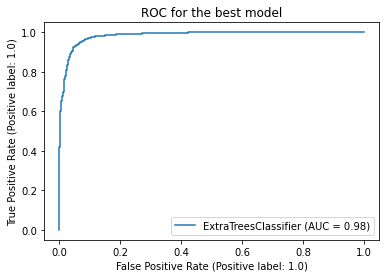

In [185]:
#lets check the AUC for the best model after hyper parameter tunning
plot_roc_curve(Final_model, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

Saving the model

In [186]:
#Saving the model
import joblib
joblib.dump(Final_model, "Tomarrow_rainweather_forecaste.pkl")

['Tomarrow_rainweather_forecaste.pkl']

Predicting the Saved model

In [187]:
#Lets load the saved model and get the predictions
model = joblib.load("Tomarrow_rainweather_forecaste.pkl")

#prediction
prediction = model.predict(x_test)
prediction

array([1., 1., 0., ..., 1., 0., 0.])

In [189]:
a=np.array(y_test)
df = pd.DataFrame()
df["predicted"] = prediction
df["Original"] = a
df

,predicted,Original
0,1.0,1.0
1,1.0,1.0
2,0.0,0.0
3,1.0,1.0
4,0.0,0.0
...,...,...
3856,0.0,0.0
3857,1.0,1.0
3858,1.0,1.0
3859,0.0,0.0


# b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

In [190]:
x = rwf_df.drop("Rainfall", axis = 1)
y = rwf_df["Rainfall"]

In [191]:
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,1.0,13.4,22.9,1.587401,0.0,13.0,44.0,13.0,14.0,20.0,...,1007.7,1007.1,8.0,7.0,16.9,21.8,0.0,0.0,12,1
1,1.0,7.4,25.1,1.587401,0.0,14.0,44.0,6.0,15.0,4.0,...,1010.6,1007.8,7.0,7.0,17.2,24.3,0.0,0.0,12,2
2,1.0,12.9,25.7,1.587401,0.0,15.0,46.0,13.0,15.0,19.0,...,1007.6,1008.7,7.0,2.0,21.0,23.2,0.0,0.0,12,3
3,1.0,9.2,28.0,1.587401,0.0,4.0,24.0,9.0,0.0,11.0,...,1017.6,1012.8,7.0,7.0,18.1,26.5,0.0,0.0,12,4
4,1.0,17.5,32.3,1.587401,0.0,13.0,41.0,1.0,7.0,7.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,1.587401,0.0,0.0,31.0,9.0,1.0,13.0,...,1024.6,1020.3,7.0,7.0,10.1,22.4,0.0,0.0,6,21
8421,9.0,3.6,25.3,1.587401,0.0,6.0,22.0,9.0,3.0,13.0,...,1023.5,1019.1,7.0,7.0,10.9,24.5,0.0,0.0,6,22
8422,9.0,5.4,26.9,1.587401,0.0,3.0,37.0,9.0,14.0,9.0,...,1021.0,1016.8,7.0,7.0,12.5,26.1,0.0,0.0,6,23
8423,9.0,7.8,27.0,1.587401,0.0,9.0,28.0,10.0,3.0,13.0,...,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,0.0,6,24


In [192]:
y

0       0.843433
1       0.000000
2       0.000000
3       0.000000
4       1.000000
          ...   
8420    0.000000
8421    0.000000
8422    0.000000
8423    0.000000
8424    0.000000
Name: Rainfall, Length: 8425, dtype: float64

In [193]:
y.value_counts()

0.000000    5539
0.584804     406
0.736806     177
0.843433     116
1.062659      86
            ... 
3.940795       1
5.039684       1
4.481405       1
3.252267       1
3.419952       1
Name: Rainfall, Length: 250, dtype: int64

# Modelling

Finding the best Random State

In [194]:
#Importing necessory libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression

Creating train test Split

In [195]:
#Finding the best Random State
maxAccu = 0
maxRS = 0
for i in range(1, 200):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state = i)
    lr = LinearRegression()
    lr.fit(x_train, y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
print("Best accuaracy is ", maxAccu, "at random_state", maxRS)

Best accuaracy is  0.8125248824560096 at random_state 154


In [196]:
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size = 0.30, random_state = maxRS)

In [197]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge

In [198]:
#Checking accuracy for LinearRegression
LR = LinearRegression()
LR.fit(x_train, y_train)
pred_LR = LR.predict(x_test)
pred_train=LR.predict(x_train)
print('R2_Score:',r2_score(y_test,pred_LR))
print('R2_Score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute error:-', mean_absolute_error(y_test, pred_LR))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_LR))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_LR)))

R2_Score: 0.8125248824560096
R2_Score on training data: 78.59533001057521
Mean Absolute error:- 0.2500117734000593
Mean Squared Error:- 0.1447942913188397
Root Mean Squared Error:- 0.38051845069436474


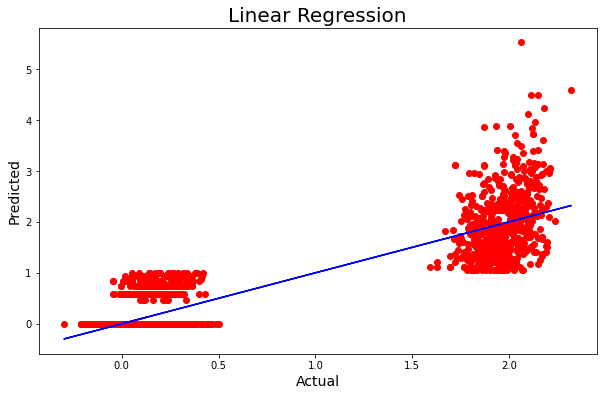

In [199]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_LR, y=y_test, color='r')
plt.plot(pred_LR, pred_LR, color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted', fontsize=14)
plt.title('Linear Regression', fontsize=20)
plt.show()

In [200]:
RFR = RandomForestRegressor()
RFR.fit(x_train, y_train)
pred_RFR = RFR.predict(x_test)
pred_train=RFR.predict(x_train)
print('R2_Score:',r2_score(y_test,pred_RFR))
print('R2_Score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute error:-', mean_absolute_error(y_test, pred_RFR))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_RFR))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_RFR)))

R2_Score: 0.8595218027342859
R2_Score on training data: 97.89206692104416
Mean Absolute error:- 0.19705293317655892
Mean Squared Error:- 0.10849675031708902
Root Mean Squared Error:- 0.3293884489733801


In [201]:
knn = KNN()
knn.fit(x_train, y_train)
pred_knn = knn.predict(x_test)
pred_train= knn.predict(x_train)
print('R2_Score:',r2_score(y_test,pred_knn))
print('R2_Score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute error:-', mean_absolute_error(y_test, pred_knn))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_knn))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_knn)))

R2_Score: 0.32143253561516594
R2_Score on training data: 55.53705487694219
Mean Absolute error:- 0.46462562164307536
Mean Squared Error:- 0.5240839232682141
Root Mean Squared Error:- 0.7239364083040817


In [202]:
knn = KNN()
knn.fit(x_train, y_train)
pred_knn = knn.predict(x_test)
pred_train=knn.predict(x_train)
print('R2_Score:',r2_score(y_test,pred_knn))
print('R2_Score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute error:-', mean_absolute_error(y_test, pred_knn))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_knn))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_knn)))

R2_Score: 0.32143253561516594
R2_Score on training data: 55.53705487694219
Mean Absolute error:- 0.46462562164307536
Mean Squared Error:- 0.5240839232682141
Root Mean Squared Error:- 0.7239364083040817


In [203]:
GBR = GradientBoostingRegressor()
GBR.fit(x_train, y_train)
pred_GBR = GBR.predict(x_test)
pred_train= GBR.predict(x_train)
print('R2_Score:',r2_score(y_test,pred_GBR))
print('R2_Score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute error:-', mean_absolute_error(y_test, pred_GBR))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_GBR))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_GBR)))

R2_Score: 0.8307540998219997
R2_Score on training data: 84.618396175468
Mean Absolute error:- 0.22953488247164078
Mean Squared Error:- 0.13071516100872657
Root Mean Squared Error:- 0.36154551720181316


In [204]:
lasso = Lasso()
lasso.fit(x_train, y_train)
pred_lasso = lasso.predict(x_test)
pred_train=lasso.predict(x_train)
print('R2_Score:',r2_score(y_test,pred_lasso))
print('R2_Score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute error:-', mean_absolute_error(y_test, pred_lasso))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_lasso))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_lasso)))

R2_Score: 0.23478764546879682
R2_Score on training data: 21.176505901841182
Mean Absolute error:- 0.5872362495446128
Mean Squared Error:- 0.5910031263576503
Root Mean Squared Error:- 0.7687672771116434


In [205]:
rd = Ridge()
rd.fit(x_train, y_train)
pred_Ridge = rd.predict(x_test)
pred_train=rd.predict(x_train)
print('R2_Score:',r2_score(y_test,pred_Ridge))
print('R2_Score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute error:-', mean_absolute_error(y_test, pred_Ridge))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_Ridge))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_Ridge)))

R2_Score: 0.812522286612369
R2_Score on training data: 78.59525243248049
Mean Absolute error:- 0.2501550495944093
Mean Squared Error:- 0.14479629618938064
Root Mean Squared Error:- 0.38052108507858096


In [207]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor ()
dtr.fit(x_train, y_train)
pred_DTR = dtr.predict(x_test)
pred_train= dtr.predict(x_train)
print('R2_Score:',r2_score(y_test,pred_DTR))
print('R2_Score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute error:-', mean_absolute_error(y_test, pred_DTR))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_DTR))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_DTR)))

R2_Score: 0.7054287005611068
R2_Score on training data: 100.0
Mean Absolute error:- 0.21182672882334372
Mean Squared Error:- 0.22750881879093138
Root Mean Squared Error:- 0.4769788452236969


In [208]:
from sklearn.svm import SVR
svr = SVR()
svr.fit(x_train, y_train)
pred_SVR = svr.predict(x_test)
pred_train= svr.predict(x_train)
print('R2_Score:',r2_score(y_test,pred_SVR))
print('R2_Score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute error:-', mean_absolute_error(y_test, pred_SVR))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_SVR))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_SVR)))

R2_Score: 0.007325824930381031
R2_Score on training data: -1.1386441621373589
Mean Absolute error:- 0.5290321621624072
Mean Squared Error:- 0.7666806964715877
Root Mean Squared Error:- 0.8756030473174403


In [209]:
from sklearn.ensemble import ExtraTreesRegressor
etr = ExtraTreesRegressor()
etr.fit(x_train, y_train)
pred_ETR = etr.predict(x_test)
pred_train= etr.predict(x_train)
print('R2_Score:',r2_score(y_test,pred_ETR))
print('R2_Score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute error:-', mean_absolute_error(y_test, pred_ETR))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_ETR))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_ETR)))

R2_Score: 0.8678996034204295
R2_Score on training data: 100.0
Mean Absolute error:- 0.17093581766783764
Mean Squared Error:- 0.10202625050328835
Root Mean Squared Error:- 0.31941548256665386


In [210]:
from sklearn.model_selection import cross_val_score

In [211]:
#checking cv score for Rabdomforest clasifier
score = cross_val_score(LR,x,y)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is-", (r2_score(y_test,pred_LR) - score.mean())*100)

[0.77661038 0.76649494 0.78727063 0.79420763 0.82925816]
0.7907683487265351
Difference between R2 score and cross validation score is- 2.1756533729474503


In [212]:
score = cross_val_score(RFR,x,y)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is-", (r2_score(y_test,pred_RFR) - score.mean())*100)

[0.78243411 0.82908316 0.88684668 0.85549678 0.83442872]
0.8376578883138386
Difference between R2 score and cross validation score is- 2.186391442044733


In [213]:
score = cross_val_score(knn,x,y)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is-", (r2_score(y_test,pred_knn) - score.mean())*100)

[0.26127298 0.23319314 0.27085264 0.17207579 0.26300434]
0.24007977599358502
Difference between R2 score and cross validation score is- 8.135275962158092


In [214]:
score = cross_val_score(GBR,x,y)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is-", (r2_score(y_test,pred_GBR) - score.mean())*100)

[0.79605674 0.79030129 0.82305283 0.81847464 0.84050814]
0.8136787278599765
Difference between R2 score and cross validation score is- 1.7075371962023134


In [215]:
score = cross_val_score(lasso,x,y)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is-", (r2_score(y_test,pred_lasso) - score.mean())*100)

[0.23863782 0.17756634 0.17341381 0.15809942 0.3086847 ]
0.21128041728312094
Difference between R2 score and cross validation score is- 2.350722818567588


In [219]:
score = cross_val_score(rd,x,y)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is-", (r2_score(y_test,pred_Ridge) - score.mean())*100)

[0.77660197 0.766471   0.78724838 0.7941988  0.82922991]
0.7907500115627561
Difference between R2 score and cross validation score is- 2.1772275049612877


In [221]:
score = cross_val_score(dtr,x,y)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is-", (r2_score(y_test,pred_DTR) - score.mean())*100)

[0.61379706 0.73307311 0.81297944 0.69812267 0.65323964]
0.7022423869757585
Difference between R2 score and cross validation score is- 0.3186313585348377


In [222]:
score = cross_val_score(svr,x,y)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is-", (r2_score(y_test,pred_SVR) - score.mean())*100)

[-0.01395376 -0.07472656 -0.00308824 -0.03436439  0.07804138]
-0.009618313817760304
Difference between R2 score and cross validation score is- 1.6944138748141335


In [223]:
score = cross_val_score(etr,x,y)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is-", (r2_score(y_test,pred_ETR) - score.mean())*100)

[0.7874554  0.84037836 0.90147635 0.86028625 0.8356129 ]
0.84504185101524
Difference between R2 score and cross validation score is- 2.28577524051895


In [224]:
from sklearn.model_selection import GridSearchCV

In [225]:
param={'alpha':[1.0,.05,.4,2], 'fit_intercept':[True, False],
      'solver':['auto', 'svd', 'cholesky', 'lsqr', 'saga', 'lbfgs'],
      'positive':[False, True],
      'random_state':[1,4,10,20]
      
      }
gscv=GridSearchCV(Ridge(),param,cv=5)
gscv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1.0, 0.05, 0.4, 2],
                         'fit_intercept': [True, False],
                         'positive': [False, True],
                         'random_state': [1, 4, 10, 20],
                         'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'saga',
                                    'lbfgs']})

In [226]:
gscv.best_params_

{'alpha': 0.4,
 'fit_intercept': False,
 'positive': False,
 'random_state': 1,
 'solver': 'auto'}

In [227]:
model=Ridge(alpha= 0.4, fit_intercept=False, positive=False, random_state= 1, solver='auto')

In [228]:
model.fit(x_train,y_train)
pred=model.predict(x_test)
print('R2_Score:',r2_score(y_test,pred))
print('Mean Absolute error:-', mean_absolute_error(y_test, pred))
print('Mean Squared Error:-', mean_squared_error(y_test, pred))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred)))

R2_Score: 0.8125080227037471
Mean Absolute error:- 0.25008469961415614
Mean Squared Error:- 0.14480731275823203
Root Mean Squared Error:- 0.3805355604384852


In [229]:
import pickle
filename="Rainfall_rainfall_weather_forecasting.pkl"
pickle.dump(model, open(filename, 'wb'))

In [230]:
import pickle
loaded_model=pickle.load(open('Rainfall_rainfall_weather_forecasting.pkl','rb')) #read permission
result=loaded_model.score(x_test, y_test)
print(result*100)

81.2508022703747


In [231]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,2518,2519,2520,2521,2522,2523,2524,2525,2526,2527
Predicted,-0.059775,0.205178,0.272936,0.278926,0.025108,2.045350,1.970643,-0.064498,2.169104,1.857686,...,0.012259,0.142873,-0.102066,0.209676,-0.132862,2.041725,-0.002943,2.112711,-0.007417,0.125094
Original,0.000000,0.000000,0.000000,0.584804,0.000000,1.686865,3.385405,0.000000,1.375069,1.532619,...,0.000000,1.000000,0.000000,0.000000,0.000000,1.663103,0.000000,4.497941,0.000000,0.000000
